# 1. Importing the neccesary libraries and packages

In [1]:
import numpy as np  # Import NumPy library for numerical operations
import os  # Import OS module for operating system related tasks
from tabulate import tabulate  # Import tabulate for creating and displaying tabular data
import matplotlib.pyplot as plt  # Import Matplotlib for creating visualizations
import itertools  # Import itertools for efficient looping
from numpy.random import seed  # Import seed function for reproducible randomization
import seaborn as sns  # Import Seaborn for statistical data visualization
import pandas as pd  # Import pandas for data manipulation and analysis
seed(1337)  # Set the seed for reproducible results
from sklearn.metrics import confusion_matrix, accuracy_score  # Import evaluation metrics from scikit-learn
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img  # Import image processing utilities from TensorFlow
from tensorflow.keras.callbacks import ModelCheckpoint  # Import ModelCheckpoint for saving the best model during training
from tensorflow.keras import layers, models, optimizers  # Import layers, models, and optimizers from TensorFlow

# Import the VGG16 model from Keras
from keras.applications.vgg16 import VGG16

# Import the ResNet50 model from Keras
from keras.applications.resnet import ResNet50

# Import the InceptionV3 model from Keras
from keras.applications.inception_v3 import InceptionV3

# Import the DenseNet201 model from Keras
from keras.applications.densenet import DenseNet201

# Import the MobileNet model from Keras
from keras.applications.mobilenet import MobileNet

# Import the Xception model from Keras
from keras.applications.xception import Xception

# Import the VGG19 model from Keras
from keras.applications.vgg19 import VGG19


# 2. Defining the necessary Functions

In [2]:
def model_summary(base_model, nb_categories=2):
    """
    Function to create a model with a given base model and number of categories.
    
    Args:
    base_model: Pre-trained base model to be used in the custom model.
    nb_categories: Number of output categories (default: 2).

    Returns:
    model: Custom model with the given base model and specified number of categories.
    """
    model = models.Sequential()  # Create a sequential model
    model.add(base_model)  # Add the base model to the sequential model
    model.add(layers.Dense(nb_categories, activation='softmax'))  # Add a dense layer with softmax activation for output

    # Create additional layers
    flatten_layer = layers.Flatten()  # Flatten layer to convert multi-dimensional input to 1D
    dense_layer_1 = layers.Dense(1024, activation='relu')  # Dense layer with 1024 units and ReLU activation
    prediction_layer = layers.Dense(2, activation='softmax')  # Prediction layer with 2 units and softmax activation

    # Combine the base model and additional layers into a new sequential model
    model = models.Sequential([
        base_model,
        flatten_layer,
        dense_layer_1,
        prediction_layer
    ])

    # Print the layer index, name, and whether it is trainable for each layer in the model
    for i, layer in enumerate(model.layers):
        print(i, layer.name, layer.trainable)
    
    # Print the model summary
    print(model.summary())
    
    return model  # Return the custom model


In [3]:
def learning_curves_plot(model):
    """
    Function to plot learning curves for training and validation accuracy and loss.
    
    Args:
    model: Trained model for which learning curves are to be plotted.

    Returns:
    None
    """
    plt.rcParams["figure.figsize"] = (12,7)  # Set the figure size

    # Extract accuracy and loss values from the model history
    acc = model.history['acc']
    val_acc = model.history['val_acc']
    loss = model.history['loss']
    val_loss = model.history['val_loss']
    epochs = range(1, len(acc) + 1)

    # Plot training and validation accuracy
    plt.figure()
    plt.plot(epochs, acc, 'b', label='Training accuracy')
    plt.plot(epochs, val_acc, 'r', label='Validation accuracy')
    plt.title('Training and validation accuracy')
    plt.legend()
    plt.savefig('Accuracy.jpg')  # Save the accuracy plot as a JPEG file

    # Plot training and validation loss
    plt.figure()
    plt.plot(epochs, loss, 'b', label='Training loss')
    plt.plot(epochs, val_loss, 'r', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()
    plt.savefig('Loss.jpg')  # Save the loss plot as a JPEG file


In [4]:
def plot_confusion_matrix(cm, classes, figname, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    """
    Function to print and plot the confusion matrix.
    
    Args:
    cm: Confusion matrix generated from the predictions of a trained model.
    classes: List of class labels.
    figname: File name for saving the confusion matrix plot.
    normalize: Boolean indicating whether to normalize the confusion matrix (default: False).
    title: Title for the confusion matrix plot (default: 'Confusion matrix').
    cmap: Colormap for the plot (default: plt.cm.Blues).

    Returns:
    None
    """
    # Normalize the confusion matrix if required
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print('Normalized confusion matrix')
    else:
        print('Confusion matrix, without normalization')

    plt.rcParams["figure.figsize"] = (20, 10)
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    # plt.colorbar()

    # Set tick marks and labels for the plot
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.

    # Display the confusion matrix values on the plot
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment='center',
                 color='white' if cm[i, j] > thresh else 'black')

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()
    plt.savefig(figname)  # Save the confusion matrix plot as a file


In [5]:
def Calculate_ConfMatrix(model):
    """
    Function to calculate the confusion matrix from a trained model's predictions on a test set.
    
    Args:
    model: Trained model used for making predictions on the test set.

    Returns:
    cm: Confusion matrix generated from the predictions of the trained model.
    y_pred: Array of predicted class labels.
    """

    # Use the model to predict class labels for the test set
    Y_pred = model.predict_generator(test_generator)
    
    # Find the index of the highest probability class for each prediction
    y_pred = np.argmax(Y_pred, axis=1)

    # Calculate the confusion matrix using the true and predicted class labels
    cm = confusion_matrix(test_generator.classes, y_pred)
    
    return cm, y_pred

In [6]:
#Set the learning rate for the model to 5 x 10^-5
learning_rate = 5e-5

def Fine_Tuning_Network(epochs, pretrainedModel):
    """
    Function to fine-tune a pre-trained model for a specific task using a training dataset and
    validation dataset.
    
    Args:
    epochs: Integer, number of epochs to run the fine-tuning process.
    pretrainedModel: Pre-trained model to be fine-tuned.

    Returns:
    model_hist: History object containing the training loss and accuracy for each epoch.
    pretrainedModel: Fine-tuned model after the training process.
    """

    # Set a checkpoint to save the best model based on validation accuracy
    checkpoint = ModelCheckpoint("sign_classifier.h5", monitor = 'val_acc', verbose=1, save_best_only=True, save_weights_only=False, mode='auto', period=1)

    # Compile the model with a specific loss function, optimizer, and metric
    pretrainedModel.compile(loss="categorical_crossentropy", optimizer=optimizers.Adam(lr=learning_rate, clipnorm = 1.), metrics = ['acc'])

    # Train the model using the training and validation dataset, and save the best model based on validation accuracy
    model_hist = pretrainedModel.fit_generator(train_generator, 
                                  epochs=epochs, 
                                  shuffle=True, 
                                  validation_data=val_generator,
                                  callbacks=[checkpoint]
                                  )
    return model_hist, pretrainedModel


# 3. Loading training,validation and testing dataset


In [7]:
# Define the paths for the dataset
PATH= "...../Image_Dataset"


#Set the paths for the training, validation, and testing data
train_data_dir = os.path.join(PATH, 'Train')
val_data_dir = os.path.join(PATH, 'Validation')
test_data_dir = os.path.join(PATH, 'Test')


# folder for storing models
outFldModels = "....../Store_Models"


# Print the categories present in the dataset
category_names = sorted(os.listdir(train_data_dir))
print('We have 2 classes in our dataset :',category_names)

# Define the output folder for storing models
outFldModels = os.path.join(PATH, 'Store_Models')

# Set the number of images to load at each iteration
batch_size = 32

# Initialize ImageDataGenerator for rescaling images
train_datagen =  ImageDataGenerator(rescale=1./255)
test_datagen =  ImageDataGenerator(rescale=1./255)

# Set the target image height and width
img_height, img_width = 224, 224

# Create train, validation, and test generators for loading images from respective directories
print('Total number of images for "training":')
train_generator = train_datagen.flow_from_directory(train_data_dir, target_size=(img_height, img_width), batch_size=batch_size, class_mode="categorical")
print('Total number of images for "validation":')
val_generator = test_datagen.flow_from_directory(val_data_dir, target_size=(img_height, img_width), batch_size=batch_size, class_mode="categorical", shuffle=False)
print('Total number of images for "testing":')
test_generator = test_datagen.flow_from_directory(test_data_dir, target_size=(img_height, img_width), batch_size=batch_size, class_mode="categorical", shuffle=False)


We have 2 classes in our dataset : ['Airport', 'Non Airport']
Total number of images for "training":
Found 384 images belonging to 2 classes.
Total number of images for "validation":
Found 82 images belonging to 2 classes.
Total number of images for "testing":
Found 82 images belonging to 2 classes.


### - Plot the number of images per category in the Training, Validation and Testing set.

In [8]:
# Initialize the number of categories and lists to store the number of images per category
nb_categories = len(category_names)
img_pr_cat = []
img_pr_cat1 = []
img_pr_cat2 = []

# Loop through each category and count the number of images in train, validation, and test directories
for category in category_names:
    folder = train_data_dir + '/' + category
    img_pr_cat.append(len(os.listdir(folder)))
    folder1 = val_data_dir + '/' + category
    img_pr_cat1.append(len(os.listdir(folder1)))
    folder2 = test_data_dir + '/' + category
    img_pr_cat2.append(len(os.listdir(folder2)))

# Combine the counts of images in train, validation, and test directories
a = list(img_pr_cat + img_pr_cat1 + img_pr_cat2)
# Repeat category names for train, validation, and test sets
b = list(category_names * 3)

# Create a dictionary with the Type of Data, Class of Image, and Number of Image
d = {'Type of Data': ['Training Set', 'Training Set', 'Validation Set', 'Validation Set', 'Testing Set', 'Testing Set'], 'Class of Image': b, 'Number of Image': a} 

# Create a pandas DataFrame from the dictionary
df = pd.DataFrame(data=d)

# Display the DataFrame
df


,Type of Data,Class of Image,Number of Image
0,Training Set,Airport,193
1,Training Set,Non Airport,193
2,Validation Set,Airport,41
3,Validation Set,Non Airport,41
4,Testing Set,Airport,41
5,Testing Set,Non Airport,41


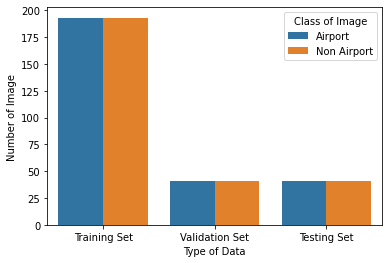

In [9]:
# Set seaborn plotting aesthetics for better visualization
plt.rcParams["figure.figsize"] = (10, 5)

# Create a grouped bar chart using seaborn
# The x-axis represents the type of dataset (training, validation, or testing)
# The y-axis represents the number of images
# The bars are colored based on the class of the image
sns.barplot(x='Type of Data', y='Number of Image', hue='Class of Image', data=df)

# Display the bar chart
plt.show()

## Calculate and plot the proportional distribution of the datasets 

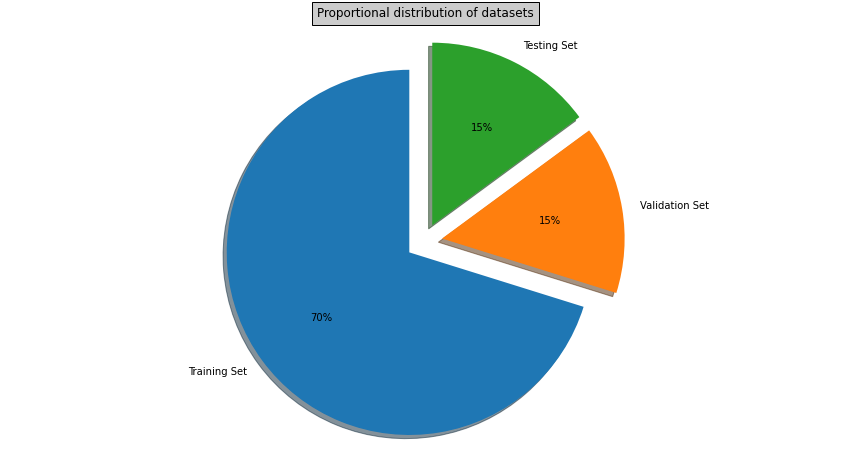

In [10]:
# Define the labels for the pie chart
labels = ['Training Set', 'Validation Set', 'Testing Set']

# Calculate the total number of images in each dataset by multiplying the number of images in the first class by 2
data = [((img_pr_cat[0]) * 2), ((img_pr_cat1[0]) * 2), ((img_pr_cat2[0]) * 2)]

# Set the figure size for the pie chart
plt.rcParams["figure.figsize"] = (15, 8)

# Define the explode parameter to emphasize the second slice (i.e. 'Validation Set')
explode = (0.1, 0.1, 0.1)

# Create the pie chart with the specified parameters
fig1, ax1 = plt.subplots()
ax1.pie(data, explode=explode, labels=labels, autopct='%1.0f%%',
        shadow=True, startangle=90)

# Set equal aspect ratio to ensure that the pie chart is drawn as a circle
ax1.axis('equal')

# Set the title for the pie chart
plt.title('Proportional distribution of datasets', bbox={'facecolor': '0.8', 'pad': 5})

# Display the pie chart
plt.show()


### - plot an example image from each category

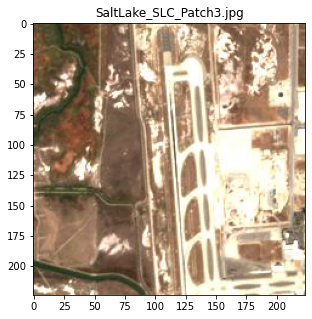

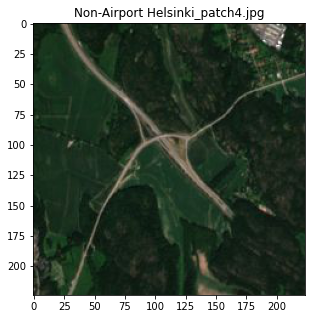

In [11]:
# Loop through each directory and subdirectory in the train_data_dir
for subdir, dirs, files in os.walk(train_data_dir):
    # Loop through each file in the subdirectory
    for file in files:
        # Create the full path to the image file
        img_file = subdir + '/' + file
        # Load the image using the Keras load_img function
        image = load_img(img_file)
        # Set the figure size for the image plot
        plt.rcParams["figure.figsize"] = (15, 5)
        # Create a new figure for the image plot
        plt.figure()
        # Set the title of the image plot to the file name
        plt.title(file)
        # Display the image in the plot
        plt.imshow(image)
        # Break the loop after plotting one image per class
        break
# Show all the image plots
plt.show()

# 4. Implementation of the Tranfer Learning Models

## 4.1. Model_VGG16

###  4.1.a VGG16: Preparing a transfer learning network

In [12]:
# Loading VGG16 model with imagenet weights, without the top layers, max pooling, and custom input shape
base_model_VGG16 = VGG16(weights='imagenet', include_top=False, pooling='max', input_shape=(img_width, img_height, 3))
# Display the model summary
base_model_VGG16.summary()

# Freeze the first 15 layers of the VGG16 model 
for layer in base_model_VGG16.layers[:15]:
    layer.trainable = False

# Iterate through the layers and print the layer index, name, and trainable status
for i, layer in enumerate(base_model_VGG16.layers):
    print(i, layer.name, layer.trainable)


2023-03-30 05:54:11.505234: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-03-30 05:54:15.173493: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 12783 MB memory:  -> device: 0, name: Quadro RTX 5000, pci bus id: 0000:01:00.0, compute capability: 7.5
2023-03-30 05:54:15.175903: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 14797 MB memory:  -> device: 1, name: Quadro RTX 5000, pci bus id: 0000:24:00.0, compute capability: 7.5
2023-03-30 05:54:15.177932: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:2 wit

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [13]:
# Create a new model by passing the pretrained VGG16 base model to the model_summary function,
# setting the number of categories to 2 (binary classification)
pretrained_modelVGG16 = model_summary(base_model_VGG16, 2)

0 vgg16 True
1 flatten True
2 dense_1 True
3 dense_2 True
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 512)               14714688  
                                                                 
 flatten (Flatten)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 1024)              525312    
                                                                 
 dense_2 (Dense)             (None, 2)                 2050      
                                                                 
Total params: 15,242,050
Trainable params: 7,606,786
Non-trainable params: 7,635,264
_________________________________________________________________
None


### 4.1.b. VGG16: Fine Tuning Network

In [14]:
# Define the number of epochs for training and start fine-tuning the VGG16 model using the Fine_Tuning_Network function
epochs = 10
modelVGG16_hist_1, modelVGG16_1 = Fine_Tuning_Network(epochs, pretrained_modelVGG16)

Epoch 1/10


/opt/conda/lib/python3.9/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)
/tmp/ipykernel_23479/3920698497.py:24: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  model_hist = pretrainedModel.fit_generator(train_generator,
2023-03-30 05:54:17.136566: I tensorflow/stream_executor/cuda/cuda_dnn.cc:368] Loaded cuDNN version 8200


12/12 [==============================] - ETA: 0s - loss: 0.5059 - acc: 0.7448
Epoch 1: val_acc improved from -inf to 0.87805, saving model to sign_classifier.h5
12/12 [==============================] - 6s 255ms/step - loss: 0.5059 - acc: 0.7448 - val_loss: 0.2760 - val_acc: 0.8780
Epoch 2/10
12/12 [==============================] - ETA: 0s - loss: 0.1470 - acc: 0.9531
Epoch 2: val_acc improved from 0.87805 to 0.93902, saving model to sign_classifier.h5
12/12 [==============================] - 2s 146ms/step - loss: 0.1470 - acc: 0.9531 - val_loss: 0.1594 - val_acc: 0.9390
Epoch 3/10
12/12 [==============================] - ETA: 0s - loss: 0.0404 - acc: 0.9870
Epoch 3: val_acc did not improve from 0.93902
12/12 [==============================] - 2s 126ms/step - loss: 0.0404 - acc: 0.9870 - val_loss: 0.0926 - val_acc: 0.9390
Epoch 4/10
12/12 [==============================] - ETA: 0s - loss: 0.0124 - acc: 1.0000
Epoch 4: val_acc improved from 0.93902 to 0.95122, saving model to sign_class

### 4.1.c VGG16: Saving the Model

In [15]:
# Save the fine-tuned VGG16 model to the specified output folder
modelVGG16_1.save(outFldModels + '/VGG16_model_E10')

2023-03-30 05:54:38.325731: W tensorflow/python/util/util.cc:368] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.


INFO:tensorflow:Assets written to: /home/jovyan/Data_MT/Store_Models_Freez/VGG16_model_E10/assets


### 4.1.d VGG16: Loading the Model

In [16]:
# Load the trained VGG16 model
modelVGG16_Trained_1 = models.load_model(outFldModels+'/VGG16_model_E10')

# Print the summary of the trained VGG16 model
#modelVGG16_Trained.summary()

In [17]:
# Print the configuration of the loaded model
modelVGG16_Trained_1.get_config()

{'name': 'sequential_1',
 'layers': [{'class_name': 'InputLayer',
   'config': {'batch_input_shape': (None, 224, 224, 3),
    'dtype': 'float32',
    'sparse': False,
    'ragged': False,
    'name': 'vgg16_input'}},
  {'class_name': 'Functional',
   'config': {'name': 'vgg16',
    'layers': [{'class_name': 'InputLayer',
      'config': {'batch_input_shape': (None, 224, 224, 3),
       'dtype': 'float32',
       'sparse': False,
       'ragged': False,
       'name': 'input_1'},
      'name': 'input_1',
      'inbound_nodes': []},
     {'class_name': 'Conv2D',
      'config': {'name': 'block1_conv1',
       'trainable': False,
       'dtype': 'float32',
       'filters': 64,
       'kernel_size': (3, 3),
       'strides': (1, 1),
       'padding': 'same',
       'data_format': 'channels_last',
       'dilation_rate': (1, 1),
       'groups': 1,
       'activation': 'relu',
       'use_bias': True,
       'kernel_initializer': {'class_name': 'GlorotUniform',
        'config': {'seed': N

### 4.1.e VGG16: Evaluation of the model accuracy

#### - Plot the learning curves

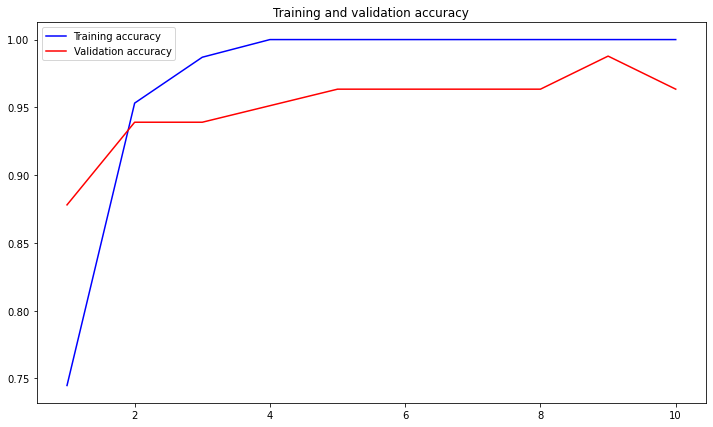

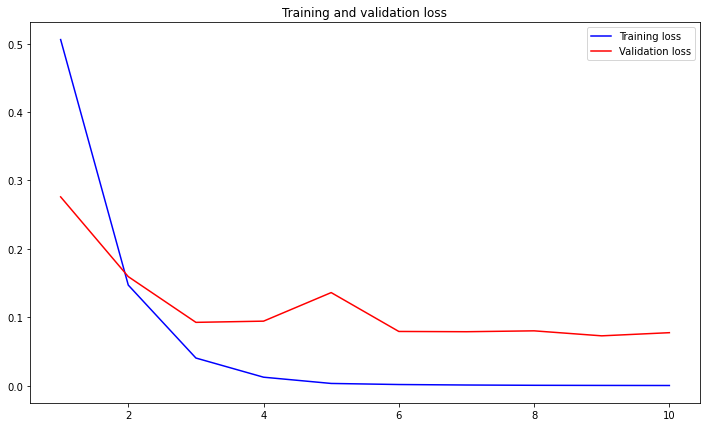

In [18]:
# This function plots the learning curves of the VGG16 model during training
# It takes the trained model history as input
learning_curves_plot(modelVGG16_hist_1)

# Displays the plot
plt.show()

#### - Calculate and plot confusion matrix

/tmp/ipykernel_23479/3885988032.py:14: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  Y_pred = model.predict_generator(test_generator)


Confusion matrix, without normalization


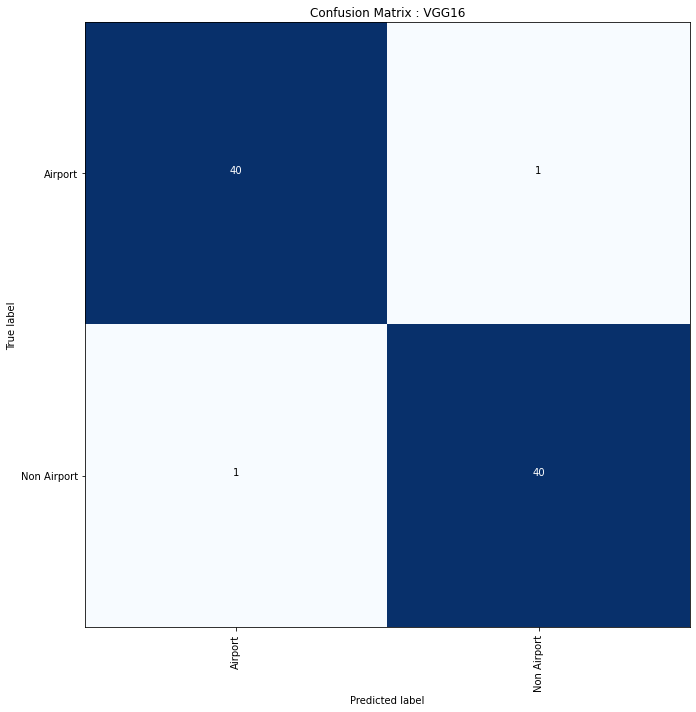

In [19]:
# Calculate the confusion matrix and predictions for the VGG16 model
cm_VGG16_1, y_pred_VGG16_1 = Calculate_ConfMatrix(modelVGG16_Trained_1)

# Plot the confusion matrix using the defined function with the given parameters
plot_confusion_matrix(cm_VGG16_1, classes=category_names, title='Confusion Matrix : VGG16', normalize=False, figname='Confusion_matrix_concrete.jpg')

# Show the plot
plt.show()

#### - Calculate the final accuracy

In [20]:
# Calculate accuracy of predictions
accuracy_VGG16_1 = accuracy_score(test_generator.classes, y_pred_VGG16_1)

# Print accuracy as percentage
print("Accuracy in test set: %0.1f%% " % (accuracy_VGG16_1 * 100))

Accuracy in test set: 97.6% 


## 4.2 Model ResNet50

### 4.2.a ResNet50: Preparing a transfer learning network

In [21]:
base_model_ResNet50 = ResNet50(weights='imagenet', include_top=False, pooling='max', input_shape = (img_width, img_height, 3))
base_model_ResNet50.summary()


for layer in base_model_ResNet50.layers[:15]:
    layer.trainable=False

for i, layer in enumerate(base_model_ResNet50.layers):
    print(i, layer.name, layer.trainable)

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_2[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

In [22]:
pretrained_modelResNet50=model_summary(base_model_ResNet50,2)

0 resnet50 True
1 flatten_1 True
2 dense_4 True
3 dense_5 True
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 2048)              23587712  
                                                                 
 flatten_1 (Flatten)         (None, 2048)              0         
                                                                 
 dense_4 (Dense)             (None, 1024)              2098176   
                                                                 
 dense_5 (Dense)             (None, 2)                 2050      
                                                                 
Total params: 25,687,938
Trainable params: 25,550,594
Non-trainable params: 137,344
_________________________________________________________________
None


### 4.2.b. ResNet50: Fine Tuning Network

In [23]:
epochs = 10

modelResNet50_hist_1, modelResNet50_1 = Fine_Tuning_Network(epochs,pretrained_modelResNet50)

Epoch 1/10


/opt/conda/lib/python3.9/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)
/tmp/ipykernel_23479/3920698497.py:24: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  model_hist = pretrainedModel.fit_generator(train_generator,


12/12 [==============================] - ETA: 0s - loss: 1.5588 - acc: 0.7240
Epoch 1: val_acc improved from -inf to 0.50000, saving model to sign_classifier.h5
12/12 [==============================] - 12s 374ms/step - loss: 1.5588 - acc: 0.7240 - val_loss: 3.1543 - val_acc: 0.5000
Epoch 2/10
12/12 [==============================] - ETA: 0s - loss: 0.2388 - acc: 0.9401
Epoch 2: val_acc did not improve from 0.50000
12/12 [==============================] - 3s 206ms/step - loss: 0.2388 - acc: 0.9401 - val_loss: 2.2174 - val_acc: 0.5000
Epoch 3/10
12/12 [==============================] - ETA: 0s - loss: 0.0610 - acc: 0.9766
Epoch 3: val_acc did not improve from 0.50000
12/12 [==============================] - 3s 206ms/step - loss: 0.0610 - acc: 0.9766 - val_loss: 3.1584 - val_acc: 0.5000
Epoch 4/10
12/12 [==============================] - ETA: 0s - loss: 0.0205 - acc: 0.9948
Epoch 4: val_acc did not improve from 0.50000
12/12 [==============================] - 3s 208ms/step - loss: 0.0205 

### 4.2.c ResNet50: Saving the Model

In [24]:
modelResNet50_1.save(outFldModels+'/ResNet50_model_E10')

INFO:tensorflow:Assets written to: /home/jovyan/Data_MT/Store_Models_Freez/ResNet50_model_E10/assets


### 4.2.d ResNet50: Loading the Model

In [25]:
modelResNet50_Trained_1 = models.load_model(outFldModels+'/ResNet50_model_E10')
modelResNet50_Trained_1.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 2048)              23587712  
                                                                 
 flatten_1 (Flatten)         (None, 2048)              0         
                                                                 
 dense_4 (Dense)             (None, 1024)              2098176   
                                                                 
 dense_5 (Dense)             (None, 2)                 2050      
                                                                 
Total params: 25,687,938
Trainable params: 25,550,594
Non-trainable params: 137,344
_________________________________________________________________


In [26]:
modelResNet50_Trained_1.get_config()

{'name': 'sequential_3',
 'layers': [{'class_name': 'InputLayer',
   'config': {'batch_input_shape': (None, 224, 224, 3),
    'dtype': 'float32',
    'sparse': False,
    'ragged': False,
    'name': 'resnet50_input'}},
  {'class_name': 'Functional',
   'config': {'name': 'resnet50',
    'layers': [{'class_name': 'InputLayer',
      'config': {'batch_input_shape': (None, 224, 224, 3),
       'dtype': 'float32',
       'sparse': False,
       'ragged': False,
       'name': 'input_2'},
      'name': 'input_2',
      'inbound_nodes': []},
     {'class_name': 'ZeroPadding2D',
      'config': {'name': 'conv1_pad',
       'trainable': False,
       'dtype': 'float32',
       'padding': ((3, 3), (3, 3)),
       'data_format': 'channels_last'},
      'name': 'conv1_pad',
      'inbound_nodes': [[['input_2', 0, 0, {}]]]},
     {'class_name': 'Conv2D',
      'config': {'name': 'conv1_conv',
       'trainable': False,
       'dtype': 'float32',
       'filters': 64,
       'kernel_size': (7, 7),

### 4.2.e ResNet50: Evaluation of the model accuracy

#### - Plot the learning curves

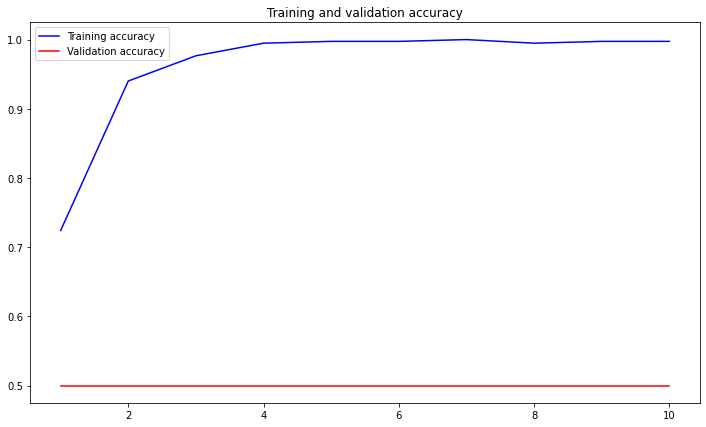

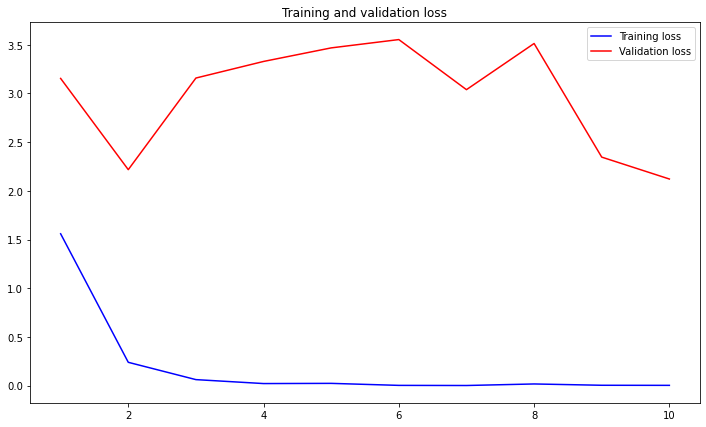

In [27]:
learning_curves_plot(modelResNet50_hist_1)
plt.show()

#### - Calculate and plot confusion matrix

/tmp/ipykernel_23479/3885988032.py:14: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  Y_pred = model.predict_generator(test_generator)


Confusion matrix, without normalization


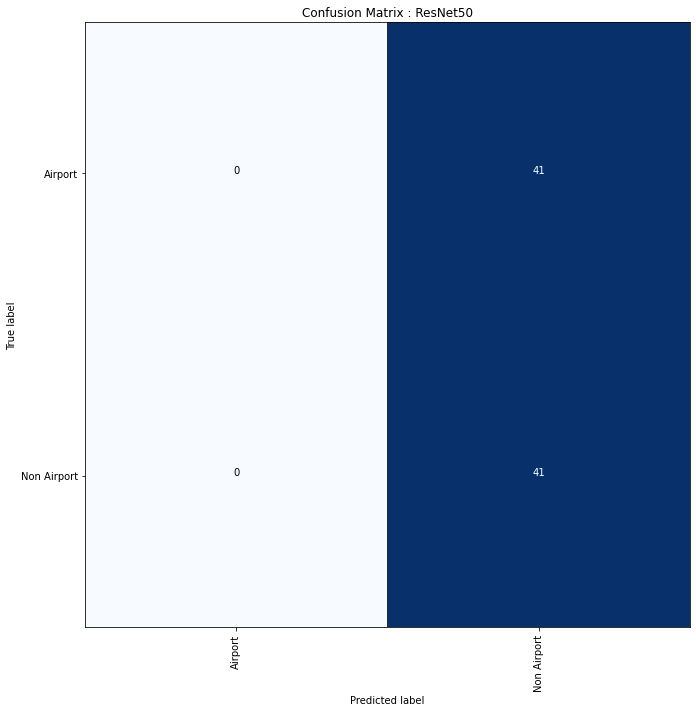

In [28]:
cm_ResNet50_1, y_pred_ResNet50_1=Calculate_ConfMatrix(modelResNet50_Trained_1)    
plot_confusion_matrix(cm_ResNet50_1, classes = category_names, title='Confusion Matrix : ResNet50', normalize=False, figname = 'Confusion_matrix_concrete.jpg')
plt.show()

#### - Calculate the final accuracy 

In [29]:
accuracy_ResNet50_1 = accuracy_score(test_generator.classes, y_pred_ResNet50_1)
print("Accuracy in test set: %0.1f%% " % (accuracy_ResNet50_1 * 100))

Accuracy in test set: 50.0% 


## 4.3. Model_InceptionV3

### 4.3.a InceptionV3: Preparing a transfer learning network

In [30]:
## Loading InceptionV3 model
base_model_InceptionV3 = InceptionV3(weights='imagenet', include_top=False, pooling='max', input_shape = (img_width, img_height, 3))
base_model_InceptionV3.summary()


for layer in base_model_InceptionV3.layers[:15]:
    layer.trainable=False

for i, layer in enumerate(base_model_InceptionV3.layers):
    print(i, layer.name, layer.trainable)

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 111, 111, 32  864         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 111, 111, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                                      

In [31]:
pretrained_modelInceptionV3=model_summary(base_model_InceptionV3,2)

0 inception_v3 True
1 flatten_2 True
2 dense_7 True
3 dense_8 True
Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 2048)              21802784  
                                                                 
 flatten_2 (Flatten)         (None, 2048)              0         
                                                                 
 dense_7 (Dense)             (None, 1024)              2098176   
                                                                 
 dense_8 (Dense)             (None, 2)                 2050      
                                                                 
Total params: 23,903,010
Trainable params: 23,696,498
Non-trainable params: 206,512
_________________________________________________________________
None


### 4.3.b. InceptionV3: Fine Tuning Network

In [32]:
epochs = 10

modelInceptionV3_hist_1, modelInceptionV3_1 = Fine_Tuning_Network(epochs,pretrained_modelInceptionV3)

Epoch 1/10


/opt/conda/lib/python3.9/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)
/tmp/ipykernel_23479/3920698497.py:24: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  model_hist = pretrainedModel.fit_generator(train_generator,


12/12 [==============================] - ETA: 0s - loss: 0.4649 - acc: 0.8021
Epoch 1: val_acc improved from -inf to 0.71951, saving model to sign_classifier.h5
12/12 [==============================] - 13s 350ms/step - loss: 0.4649 - acc: 0.8021 - val_loss: 1.0362 - val_acc: 0.7195
Epoch 2/10
12/12 [==============================] - ETA: 0s - loss: 0.0840 - acc: 0.9688
Epoch 2: val_acc did not improve from 0.71951
12/12 [==============================] - 2s 141ms/step - loss: 0.0840 - acc: 0.9688 - val_loss: 1.2809 - val_acc: 0.7073
Epoch 3/10
12/12 [==============================] - ETA: 0s - loss: 0.0140 - acc: 0.9974
Epoch 3: val_acc improved from 0.71951 to 0.85366, saving model to sign_classifier.h5
12/12 [==============================] - 3s 218ms/step - loss: 0.0140 - acc: 0.9974 - val_loss: 0.5993 - val_acc: 0.8537
Epoch 4/10
12/12 [==============================] - ETA: 0s - loss: 0.0163 - acc: 0.9974
Epoch 4: val_acc did not improve from 0.85366
12/12 [=======================

### 4.3.c InceptionV3: Saving the Model 

In [33]:
modelInceptionV3_1.save(outFldModels+'/InceptionV3_model_E10')

INFO:tensorflow:Assets written to: /home/jovyan/Data_MT/Store_Models_Freez/InceptionV3_model_E10/assets


### 4.3.d InceptionV3: Loading the Model

In [34]:
modelInceptionV3_Trained_1 = models.load_model(outFldModels+'/InceptionV3_model_E10')
modelInceptionV3_Trained_1.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 2048)              21802784  
                                                                 
 flatten_2 (Flatten)         (None, 2048)              0         
                                                                 
 dense_7 (Dense)             (None, 1024)              2098176   
                                                                 
 dense_8 (Dense)             (None, 2)                 2050      
                                                                 
Total params: 23,903,010
Trainable params: 23,696,498
Non-trainable params: 206,512
_________________________________________________________________


In [35]:
modelInceptionV3_Trained_1.get_config()

{'name': 'sequential_5',
 'layers': [{'class_name': 'InputLayer',
   'config': {'batch_input_shape': (None, 224, 224, 3),
    'dtype': 'float32',
    'sparse': False,
    'ragged': False,
    'name': 'inception_v3_input'}},
  {'class_name': 'Functional',
   'config': {'name': 'inception_v3',
    'layers': [{'class_name': 'InputLayer',
      'config': {'batch_input_shape': (None, 224, 224, 3),
       'dtype': 'float32',
       'sparse': False,
       'ragged': False,
       'name': 'input_3'},
      'name': 'input_3',
      'inbound_nodes': []},
     {'class_name': 'Conv2D',
      'config': {'name': 'conv2d',
       'trainable': False,
       'dtype': 'float32',
       'filters': 32,
       'kernel_size': (3, 3),
       'strides': (2, 2),
       'padding': 'valid',
       'data_format': 'channels_last',
       'dilation_rate': (1, 1),
       'groups': 1,
       'activation': 'linear',
       'use_bias': False,
       'kernel_initializer': {'class_name': 'GlorotUniform',
        'config'

### 4.3.e InceptionV3: Evaluation of the model accuracy 

#### - Plot the learning curves

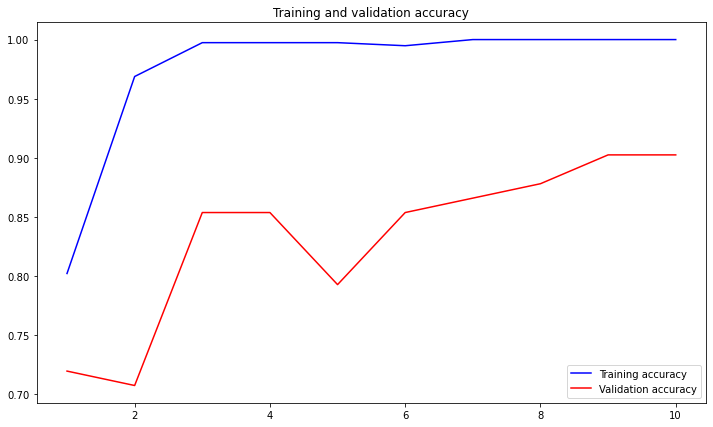

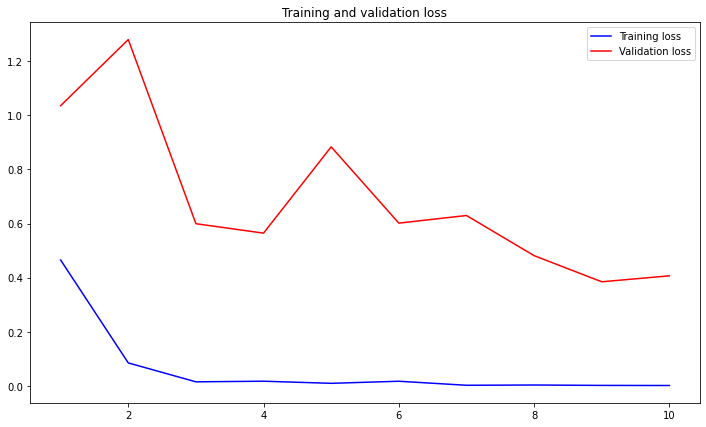

In [36]:
learning_curves_plot(modelInceptionV3_hist_1)
plt.show()


#### - Calculate and plot confusion matrix

/tmp/ipykernel_23479/3885988032.py:14: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  Y_pred = model.predict_generator(test_generator)


Confusion matrix, without normalization


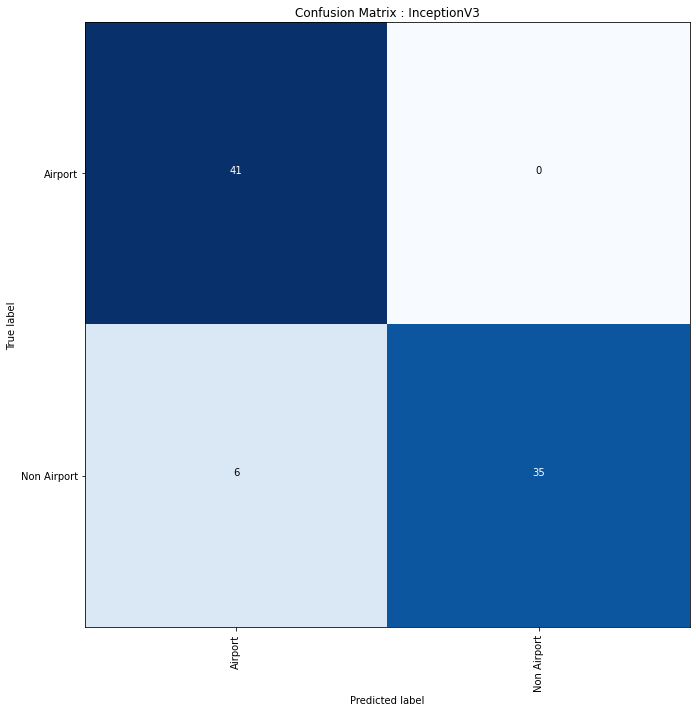

In [37]:
cm_InceptionV3_1, y_pred_InceptionV3_1=Calculate_ConfMatrix(modelInceptionV3_Trained_1)    
plot_confusion_matrix(cm_InceptionV3_1, classes = category_names, title='Confusion Matrix : InceptionV3', normalize=False, figname = 'Confusion_matrix_concrete.jpg')
plt.show()
    

#### - Calculate the final accuracy

In [38]:
accuracy_InceptionV3_1 = accuracy_score(test_generator.classes, y_pred_InceptionV3_1)
print("Accuracy in test set: %0.1f%% " % (accuracy_InceptionV3_1 * 100))

Accuracy in test set: 92.7% 


## 4.4. Model_MobileNet

### 4.4.a MobileNet: Preparing a transfer learning network

In [39]:
## Loading MobileNet model
base_model_MobileNet = MobileNet(weights='imagenet', include_top=False, pooling='max', input_shape = (img_width, img_height, 3))
base_model_MobileNet.summary()


for layer in base_model_MobileNet.layers[:15]:
    layer.trainable=False

for i, layer in enumerate(base_model_MobileNet.layers):
    print(i, layer.name, layer.trainable)

Model: "mobilenet_1.00_224"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 112, 112, 32)      864       
                                                                 
 conv1_bn (BatchNormalizatio  (None, 112, 112, 32)     128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (None, 112, 112, 32)      0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (None, 112, 112, 32)     288       
                                                                 
 conv_dw_1_bn (BatchNormaliz  (None, 112, 112, 32)     128       
 ation)                                         

In [40]:
pretrained_modelMobileNet=model_summary(base_model_MobileNet,2)

0 mobilenet_1.00_224 True
1 flatten_3 True
2 dense_10 True
3 dense_11 True
Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_224 (Functio  (None, 1024)             3228864   
 nal)                                                            
                                                                 
 flatten_3 (Flatten)         (None, 1024)              0         
                                                                 
 dense_10 (Dense)            (None, 1024)              1049600   
                                                                 
 dense_11 (Dense)            (None, 2)                 2050      
                                                                 
Total params: 4,280,514
Trainable params: 4,246,274
Non-trainable params: 34,240
_________________________________________________________________
None


### 4.4.b. MobileNet: Fine Tuning Network

In [41]:
epochs = 10

modelMobileNet_hist_1, modelMobileNet_1 = Fine_Tuning_Network(epochs,pretrained_modelMobileNet)

Epoch 1/10


/opt/conda/lib/python3.9/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)
/tmp/ipykernel_23479/3920698497.py:24: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  model_hist = pretrainedModel.fit_generator(train_generator,


12/12 [==============================] - ETA: 0s - loss: 0.9707 - acc: 0.6250
Epoch 1: val_acc improved from -inf to 0.62195, saving model to sign_classifier.h5
12/12 [==============================] - 5s 154ms/step - loss: 0.9707 - acc: 0.6250 - val_loss: 1.0123 - val_acc: 0.6220
Epoch 2/10
12/12 [==============================] - ETA: 0s - loss: 0.1585 - acc: 0.9297
Epoch 2: val_acc improved from 0.62195 to 0.76829, saving model to sign_classifier.h5
12/12 [==============================] - 1s 105ms/step - loss: 0.1585 - acc: 0.9297 - val_loss: 0.5330 - val_acc: 0.7683
Epoch 3/10
12/12 [==============================] - ETA: 0s - loss: 0.0446 - acc: 0.9766
Epoch 3: val_acc did not improve from 0.76829
12/12 [==============================] - 1s 82ms/step - loss: 0.0446 - acc: 0.9766 - val_loss: 0.8629 - val_acc: 0.7317
Epoch 4/10
12/12 [==============================] - ETA: 0s - loss: 0.0072 - acc: 1.0000
Epoch 4: val_acc did not improve from 0.76829
12/12 [=========================

### 4.4.c MobileNet: Saving the Model

In [42]:
modelMobileNet_1.save(outFldModels+'/MobileNet_model_E10')

INFO:tensorflow:Assets written to: /home/jovyan/Data_MT/Store_Models_Freez/MobileNet_model_E10/assets


INFO:tensorflow:Assets written to: /home/jovyan/Data_MT/Store_Models_Freez/MobileNet_model_E10/assets


### 4.4.d MobileNet: Loading the Model 

In [43]:
modelMobileNet_Trained_1 = models.load_model(outFldModels+'/MobileNet_model_E10')
modelMobileNet_Trained_1.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_224 (Functio  (None, 1024)             3228864   
 nal)                                                            
                                                                 
 flatten_3 (Flatten)         (None, 1024)              0         
                                                                 
 dense_10 (Dense)            (None, 1024)              1049600   
                                                                 
 dense_11 (Dense)            (None, 2)                 2050      
                                                                 
Total params: 4,280,514
Trainable params: 4,246,274
Non-trainable params: 34,240
_________________________________________________________________


In [44]:
modelMobileNet_Trained_1.get_config()

{'name': 'sequential_7',
 'layers': [{'class_name': 'InputLayer',
   'config': {'batch_input_shape': (None, 224, 224, 3),
    'dtype': 'float32',
    'sparse': False,
    'ragged': False,
    'name': 'mobilenet_1.00_224_input'}},
  {'class_name': 'Functional',
   'config': {'name': 'mobilenet_1.00_224',
    'layers': [{'class_name': 'InputLayer',
      'config': {'batch_input_shape': (None, 224, 224, 3),
       'dtype': 'float32',
       'sparse': False,
       'ragged': False,
       'name': 'input_4'},
      'name': 'input_4',
      'inbound_nodes': []},
     {'class_name': 'Conv2D',
      'config': {'name': 'conv1',
       'trainable': False,
       'dtype': 'float32',
       'filters': 32,
       'kernel_size': (3, 3),
       'strides': (2, 2),
       'padding': 'same',
       'data_format': 'channels_last',
       'dilation_rate': (1, 1),
       'groups': 1,
       'activation': 'linear',
       'use_bias': False,
       'kernel_initializer': {'class_name': 'GlorotUniform',
      

### 4.4.e MobileNet: Evaluation of the model accuracy

#### - Plot the learning curves

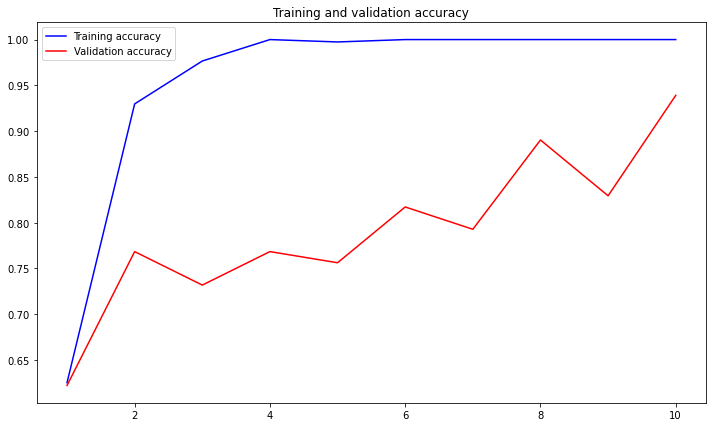

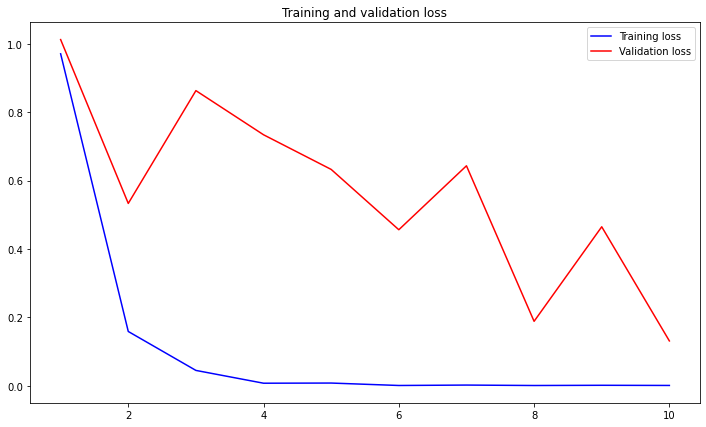

In [45]:
learning_curves_plot(modelMobileNet_hist_1)
plt.show()

#### - Calculate and plot confusion matrix

/tmp/ipykernel_23479/3885988032.py:14: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  Y_pred = model.predict_generator(test_generator)


Confusion matrix, without normalization


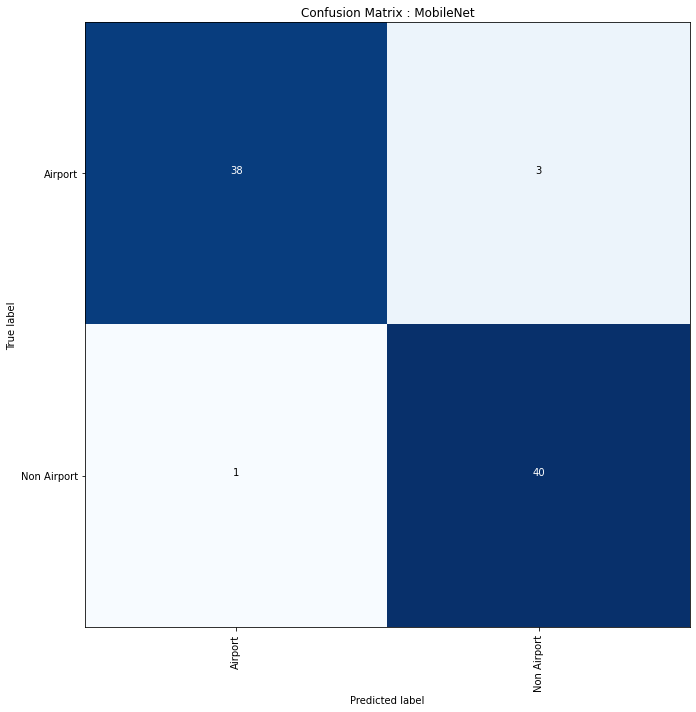

In [46]:
cm_MobileNet_1, y_pred_MobileNet_1=Calculate_ConfMatrix(modelMobileNet_Trained_1)   
plot_confusion_matrix(cm_MobileNet_1, classes = category_names, title='Confusion Matrix : MobileNet', normalize=False, figname = 'Confusion_matrix_concrete.jpg') 
plt.show()

#### - Calculate the final accuracy

In [47]:
accuracy_MobileNet_1 = accuracy_score(test_generator.classes, y_pred_MobileNet_1)
print("Accuracy in test set: %0.1f%% " % (accuracy_MobileNet_1 * 100))

Accuracy in test set: 95.1% 


## 4.5. Model_DenseNet201

### 4.5.a DenseNet201: Preparing a transfer learning network

In [48]:
## Loading DenseNet201 model
base_model_DenseNet201 = DenseNet201(weights='imagenet', include_top=False, pooling='max', input_shape = (img_width, img_height, 3))
base_model_DenseNet201.summary()


for layer in base_model_DenseNet201.layers[:15]:
    layer.trainable=False

for i, layer in enumerate(base_model_DenseNet201.layers):
    print(i, layer.name, layer.trainable)

Model: "densenet201"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0          ['input_5[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (None, 112, 112, 64  9408        ['zero_padding2d[0][0]']         
                                )                                                                 
                                                                                        

In [49]:
pretrained_modelDenseNet201=model_summary(base_model_DenseNet201,2)

0 densenet201 True
1 flatten_4 True
2 dense_13 True
3 dense_14 True
Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 densenet201 (Functional)    (None, 1920)              18321984  
                                                                 
 flatten_4 (Flatten)         (None, 1920)              0         
                                                                 
 dense_13 (Dense)            (None, 1024)              1967104   
                                                                 
 dense_14 (Dense)            (None, 2)                 2050      
                                                                 
Total params: 20,291,138
Trainable params: 20,006,914
Non-trainable params: 284,224
_________________________________________________________________
None


### 4.5.b. DenseNet201: Fine Tuning Network

In [50]:
epochs = 10

modelDenseNet201_hist_1, modelDenseNet201_1 = Fine_Tuning_Network(epochs,pretrained_modelDenseNet201)

Epoch 1/10


/opt/conda/lib/python3.9/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)
/tmp/ipykernel_23479/3920698497.py:24: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  model_hist = pretrainedModel.fit_generator(train_generator,


12/12 [==============================] - ETA: 0s - loss: 0.6152 - acc: 0.7344
Epoch 1: val_acc improved from -inf to 0.84146, saving model to sign_classifier.h5
12/12 [==============================] - 36s 785ms/step - loss: 0.6152 - acc: 0.7344 - val_loss: 0.3862 - val_acc: 0.8415
Epoch 2/10
12/12 [==============================] - ETA: 0s - loss: 0.0191 - acc: 0.9948
Epoch 2: val_acc did not improve from 0.84146
12/12 [==============================] - 4s 345ms/step - loss: 0.0191 - acc: 0.9948 - val_loss: 0.5784 - val_acc: 0.7927
Epoch 3/10
12/12 [==============================] - ETA: 0s - loss: 0.0255 - acc: 0.9922
Epoch 3: val_acc did not improve from 0.84146
12/12 [==============================] - 4s 348ms/step - loss: 0.0255 - acc: 0.9922 - val_loss: 0.5640 - val_acc: 0.8049
Epoch 4/10
12/12 [==============================] - ETA: 0s - loss: 0.0070 - acc: 0.9974
Epoch 4: val_acc did not improve from 0.84146
12/12 [==============================] - 4s 347ms/step - loss: 0.0070 

### 4.5.c DenseNet201: Saving the Model 

In [51]:
modelDenseNet201_1.save(outFldModels+'/DenseNet201_model_E10')

INFO:tensorflow:Assets written to: /home/jovyan/Data_MT/Store_Models_Freez/DenseNet201_model_E10/assets


INFO:tensorflow:Assets written to: /home/jovyan/Data_MT/Store_Models_Freez/DenseNet201_model_E10/assets


### 4.5.d DenseNet201: Loading the Model


In [52]:
modelDenseNet201_Trained_1 = models.load_model(outFldModels+'/DenseNet201_model_E10')
modelDenseNet201_Trained_1.summary()

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 densenet201 (Functional)    (None, 1920)              18321984  
                                                                 
 flatten_4 (Flatten)         (None, 1920)              0         
                                                                 
 dense_13 (Dense)            (None, 1024)              1967104   
                                                                 
 dense_14 (Dense)            (None, 2)                 2050      
                                                                 
Total params: 20,291,138
Trainable params: 20,006,914
Non-trainable params: 284,224
_________________________________________________________________


In [53]:
modelDenseNet201_Trained_1.get_config()

{'name': 'sequential_9',
 'layers': [{'class_name': 'InputLayer',
   'config': {'batch_input_shape': (None, 224, 224, 3),
    'dtype': 'float32',
    'sparse': False,
    'ragged': False,
    'name': 'densenet201_input'}},
  {'class_name': 'Functional',
   'config': {'name': 'densenet201',
    'layers': [{'class_name': 'InputLayer',
      'config': {'batch_input_shape': (None, 224, 224, 3),
       'dtype': 'float32',
       'sparse': False,
       'ragged': False,
       'name': 'input_5'},
      'name': 'input_5',
      'inbound_nodes': []},
     {'class_name': 'ZeroPadding2D',
      'config': {'name': 'zero_padding2d',
       'trainable': False,
       'dtype': 'float32',
       'padding': ((3, 3), (3, 3)),
       'data_format': 'channels_last'},
      'name': 'zero_padding2d',
      'inbound_nodes': [[['input_5', 0, 0, {}]]]},
     {'class_name': 'Conv2D',
      'config': {'name': 'conv1/conv',
       'trainable': False,
       'dtype': 'float32',
       'filters': 64,
       'kerne

### 4.5.e DenseNet201: Evaluation of the model accuracy

#### - Plot the learning curves

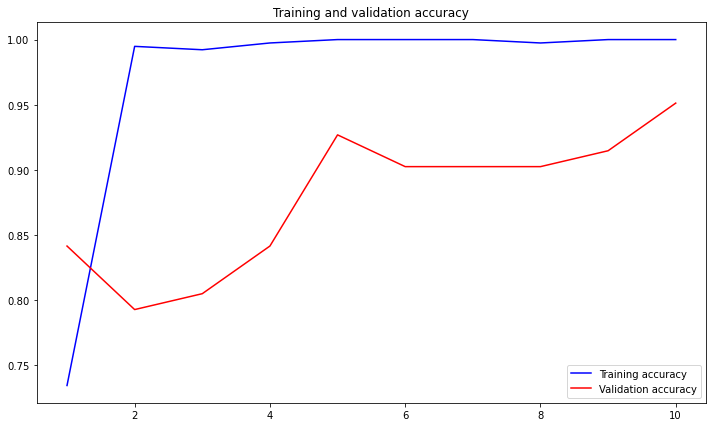

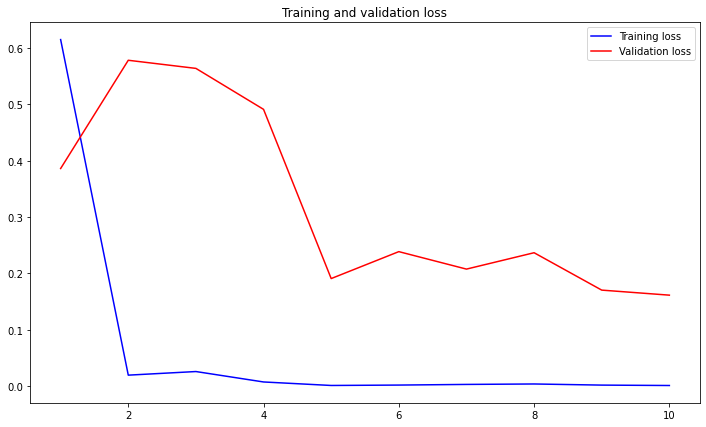

In [54]:
learning_curves_plot(modelDenseNet201_hist_1)
plt.show()

#### - Calculate and plot confusion matrix

/tmp/ipykernel_23479/3885988032.py:14: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  Y_pred = model.predict_generator(test_generator)


Confusion matrix, without normalization


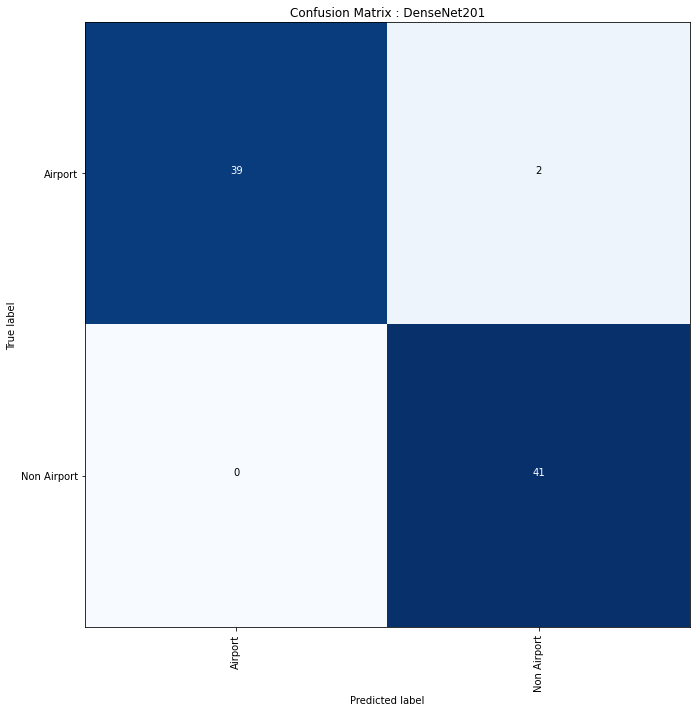

In [55]:
cm_DenseNet201_1, y_pred_DenseNet201_1=Calculate_ConfMatrix(modelDenseNet201_Trained_1)   
plot_confusion_matrix(cm_DenseNet201_1, classes = category_names, title='Confusion Matrix : DenseNet201', normalize=False, figname = 'Confusion_matrix_concrete.jpg')
plt.show()

#### - Calculate the final accuracy

In [56]:
accuracy_DenseNet201_1 = accuracy_score(test_generator.classes, y_pred_DenseNet201_1)
print("Accuracy in test set: %0.1f%% " % (accuracy_DenseNet201_1 * 100))

Accuracy in test set: 97.6% 


## 3.6. Model_Xception

### 3.6.a Xception: Preparing a transfer learning network

In [57]:
## Loading Xeption model
base_model_Xception = Xception(weights='imagenet', include_top=False, pooling='max', input_shape = (img_width, img_height, 3))
base_model_Xception.summary()


for layer in base_model_Xception.layers[:15]:
    layer.trainable=False

for i, layer in enumerate(base_model_Xception.layers):
    print(i, layer.name, layer.trainable)

Model: "xception"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 111, 111, 32  864         ['input_6[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 111, 111, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                                                          

In [58]:
pretrained_modelXception=model_summary(base_model_Xception,2)

0 xception True
1 flatten_5 True
2 dense_16 True
3 dense_17 True
Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 xception (Functional)       (None, 2048)              20861480  
                                                                 
 flatten_5 (Flatten)         (None, 2048)              0         
                                                                 
 dense_16 (Dense)            (None, 1024)              2098176   
                                                                 
 dense_17 (Dense)            (None, 2)                 2050      
                                                                 
Total params: 22,961,706
Trainable params: 22,852,426
Non-trainable params: 109,280
_________________________________________________________________
None


### 4.6.b. Xcception: Fine Tuning Network

In [59]:
epochs = 10

modelXception_hist_1, modelXception_1 = Fine_Tuning_Network(epochs,pretrained_modelXception)

Epoch 1/10


/opt/conda/lib/python3.9/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)
/tmp/ipykernel_23479/3920698497.py:24: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  model_hist = pretrainedModel.fit_generator(train_generator,


12/12 [==============================] - ETA: 0s - loss: 0.5143 - acc: 0.7526
Epoch 1: val_acc improved from -inf to 0.92683, saving model to sign_classifier.h5
12/12 [==============================] - 10s 395ms/step - loss: 0.5143 - acc: 0.7526 - val_loss: 0.2597 - val_acc: 0.9268
Epoch 2/10
12/12 [==============================] - ETA: 0s - loss: 0.0709 - acc: 0.9818
Epoch 2: val_acc improved from 0.92683 to 0.95122, saving model to sign_classifier.h5
12/12 [==============================] - 4s 303ms/step - loss: 0.0709 - acc: 0.9818 - val_loss: 0.1408 - val_acc: 0.9512
Epoch 3/10
12/12 [==============================] - ETA: 0s - loss: 0.0136 - acc: 0.9974
Epoch 3: val_acc did not improve from 0.95122
12/12 [==============================] - 3s 245ms/step - loss: 0.0136 - acc: 0.9974 - val_loss: 0.1710 - val_acc: 0.9512
Epoch 4/10
12/12 [==============================] - ETA: 0s - loss: 0.0038 - acc: 1.0000
Epoch 4: val_acc did not improve from 0.95122
12/12 [=======================

### 4.6.c Xeption: Saving the Model

In [60]:
modelXception_1.save(outFldModels+'/Xception_model_E10')

INFO:tensorflow:Assets written to: /home/jovyan/Data_MT/Store_Models_Freez/Xception_model_E10/assets


INFO:tensorflow:Assets written to: /home/jovyan/Data_MT/Store_Models_Freez/Xception_model_E10/assets


### 4.6.d Xeption: Loading the Model

In [61]:
modelXception_Trained_1 = models.load_model(outFldModels+'/Xception_model_E10')
modelXception_Trained_1.summary()

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 xception (Functional)       (None, 2048)              20861480  
                                                                 
 flatten_5 (Flatten)         (None, 2048)              0         
                                                                 
 dense_16 (Dense)            (None, 1024)              2098176   
                                                                 
 dense_17 (Dense)            (None, 2)                 2050      
                                                                 
Total params: 22,961,706
Trainable params: 22,852,426
Non-trainable params: 109,280
_________________________________________________________________


In [62]:
modelXception_Trained_1.get_config()

{'name': 'sequential_11',
 'layers': [{'class_name': 'InputLayer',
   'config': {'batch_input_shape': (None, 224, 224, 3),
    'dtype': 'float32',
    'sparse': False,
    'ragged': False,
    'name': 'xception_input'}},
  {'class_name': 'Functional',
   'config': {'name': 'xception',
    'layers': [{'class_name': 'InputLayer',
      'config': {'batch_input_shape': (None, 224, 224, 3),
       'dtype': 'float32',
       'sparse': False,
       'ragged': False,
       'name': 'input_6'},
      'name': 'input_6',
      'inbound_nodes': []},
     {'class_name': 'Conv2D',
      'config': {'name': 'block1_conv1',
       'trainable': False,
       'dtype': 'float32',
       'filters': 32,
       'kernel_size': (3, 3),
       'strides': (2, 2),
       'padding': 'valid',
       'data_format': 'channels_last',
       'dilation_rate': (1, 1),
       'groups': 1,
       'activation': 'linear',
       'use_bias': False,
       'kernel_initializer': {'class_name': 'GlorotUniform',
        'config':

### 4.6.e Xception: Evaluation of the model accuracy

#### - Plot the learning curves

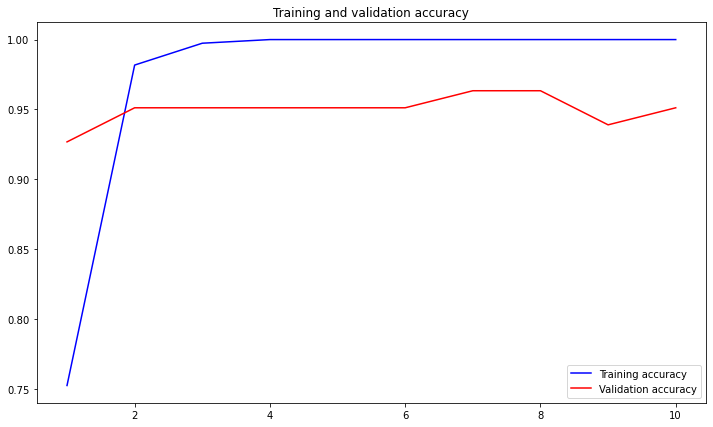

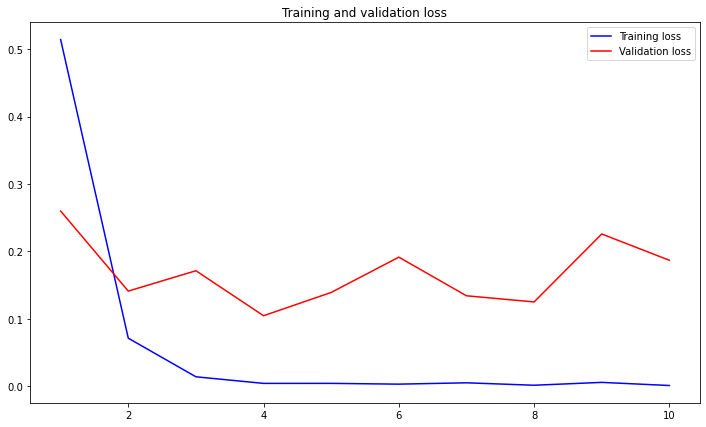

In [63]:
learning_curves_plot(modelXception_hist_1)
plt.show()

#### - Calculate and plot confusion matrix

/tmp/ipykernel_23479/3885988032.py:14: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  Y_pred = model.predict_generator(test_generator)


Confusion matrix, without normalization


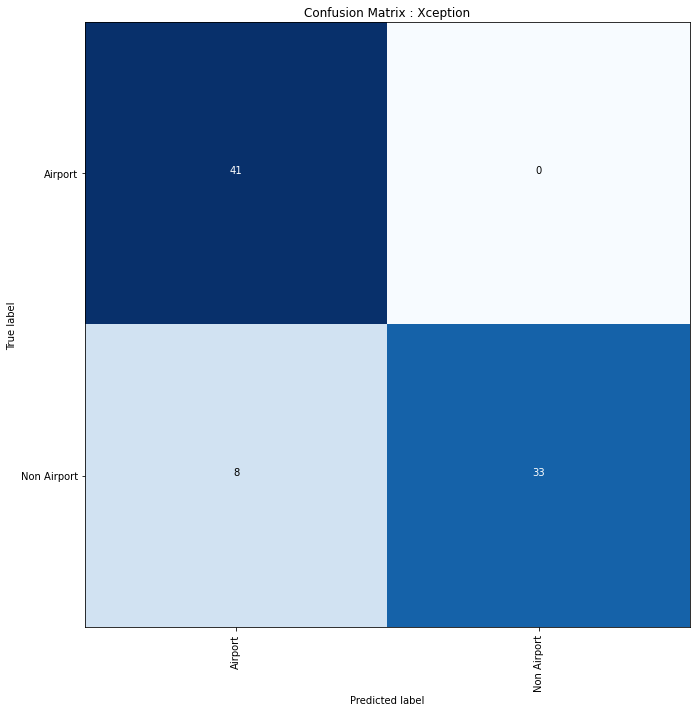

In [64]:
cm_Xception_1, y_pred_Xception_1=Calculate_ConfMatrix(modelXception_Trained_1)    
plot_confusion_matrix(cm_Xception_1, classes = category_names, title='Confusion Matrix : Xception', normalize=False, figname = 'Confusion_matrix_concrete.jpg')
plt.show()

#### - Calculate the final accuracy

In [65]:
accuracy_Xception_1 = accuracy_score(test_generator.classes, y_pred_Xception_1)
print("Accuracy in test set: %0.1f%% " % (accuracy_Xception_1 * 100))

Accuracy in test set: 90.2% 


## 4.7. Model_VGG19

### 4.7.a VGG19: Preparing a transfer learning network

In [66]:
## Loading VGG19 model
base_model_VGG19 = VGG19(weights='imagenet', include_top=False, pooling='max', input_shape = (img_width, img_height, 3))
base_model_VGG19.summary()


for layer in base_model_VGG19.layers[:15]:
    layer.trainable=False

for i, layer in enumerate(base_model_VGG19.layers):
    print(i, layer.name, layer.trainable)

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [67]:
pretrained_modelVGG19=model_summary(base_model_VGG19,2)

0 vgg19 True
1 flatten_6 True
2 dense_19 True
3 dense_20 True
Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 512)               20024384  
                                                                 
 flatten_6 (Flatten)         (None, 512)               0         
                                                                 
 dense_19 (Dense)            (None, 1024)              525312    
                                                                 
 dense_20 (Dense)            (None, 2)                 2050      
                                                                 
Total params: 20,551,746
Trainable params: 12,326,402
Non-trainable params: 8,225,344
_________________________________________________________________
None


### 4.7.b. VGG19: Fine Tuning Network

In [68]:
#Define the epoch parameter and start training
epochs = 10

modelVGG19_hist_1, modelVGG19_1 = Fine_Tuning_Network(epochs,pretrained_modelVGG19)

Epoch 1/10


/opt/conda/lib/python3.9/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)
/tmp/ipykernel_23479/3920698497.py:24: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  model_hist = pretrainedModel.fit_generator(train_generator,


12/12 [==============================] - ETA: 0s - loss: 0.4789 - acc: 0.7422
Epoch 1: val_acc improved from -inf to 0.87805, saving model to sign_classifier.h5
12/12 [==============================] - 3s 208ms/step - loss: 0.4789 - acc: 0.7422 - val_loss: 0.2819 - val_acc: 0.8780
Epoch 2/10
12/12 [==============================] - ETA: 0s - loss: 0.1705 - acc: 0.9401
Epoch 2: val_acc improved from 0.87805 to 0.95122, saving model to sign_classifier.h5
12/12 [==============================] - 2s 190ms/step - loss: 0.1705 - acc: 0.9401 - val_loss: 0.1408 - val_acc: 0.9512
Epoch 3/10
12/12 [==============================] - ETA: 0s - loss: 0.0920 - acc: 0.9635
Epoch 3: val_acc did not improve from 0.95122
12/12 [==============================] - 2s 156ms/step - loss: 0.0920 - acc: 0.9635 - val_loss: 0.1104 - val_acc: 0.9268
Epoch 4/10
12/12 [==============================] - ETA: 0s - loss: 0.0215 - acc: 0.9948
Epoch 4: val_acc improved from 0.95122 to 0.96341, saving model to sign_class

### 4.7.c VGG19: Saving the Model


In [69]:
modelVGG19_1.save(outFldModels+'/VGG19_model_E10')

INFO:tensorflow:Assets written to: /home/jovyan/Data_MT/Store_Models_Freez/VGG19_model_E10/assets


INFO:tensorflow:Assets written to: /home/jovyan/Data_MT/Store_Models_Freez/VGG19_model_E10/assets


### 4.7.d VGG19: Loading the Model 

In [70]:
modelVGG19_Trained_1 = models.load_model(outFldModels+'/VGG19_model_E10')
modelVGG19_Trained_1.summary()

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 512)               20024384  
                                                                 
 flatten_6 (Flatten)         (None, 512)               0         
                                                                 
 dense_19 (Dense)            (None, 1024)              525312    
                                                                 
 dense_20 (Dense)            (None, 2)                 2050      
                                                                 
Total params: 20,551,746
Trainable params: 12,326,402
Non-trainable params: 8,225,344
_________________________________________________________________


In [71]:
modelVGG19_Trained_1.get_config()

{'name': 'sequential_13',
 'layers': [{'class_name': 'InputLayer',
   'config': {'batch_input_shape': (None, 224, 224, 3),
    'dtype': 'float32',
    'sparse': False,
    'ragged': False,
    'name': 'vgg19_input'}},
  {'class_name': 'Functional',
   'config': {'name': 'vgg19',
    'layers': [{'class_name': 'InputLayer',
      'config': {'batch_input_shape': (None, 224, 224, 3),
       'dtype': 'float32',
       'sparse': False,
       'ragged': False,
       'name': 'input_7'},
      'name': 'input_7',
      'inbound_nodes': []},
     {'class_name': 'Conv2D',
      'config': {'name': 'block1_conv1',
       'trainable': False,
       'dtype': 'float32',
       'filters': 64,
       'kernel_size': (3, 3),
       'strides': (1, 1),
       'padding': 'same',
       'data_format': 'channels_last',
       'dilation_rate': (1, 1),
       'groups': 1,
       'activation': 'relu',
       'use_bias': True,
       'kernel_initializer': {'class_name': 'GlorotUniform',
        'config': {'seed': 

### 4.7.e VGG19: Evaluation of the model accuracy

#### - Plot the learning curves

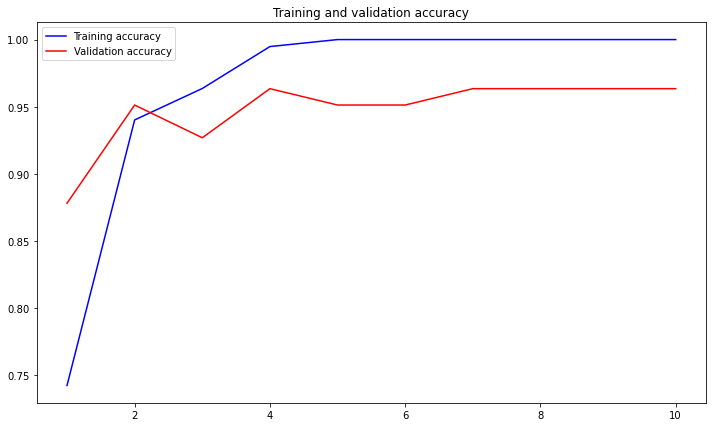

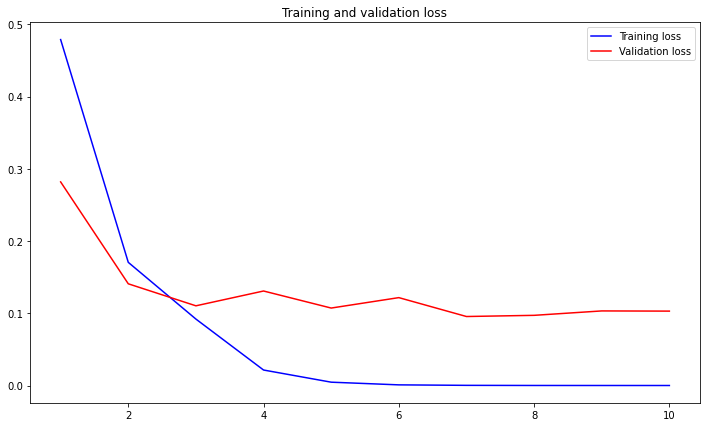

In [72]:
learning_curves_plot(modelVGG19_hist_1)
plt.show()

#### - Calculate and plot confusion matrix

/tmp/ipykernel_23479/3885988032.py:14: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  Y_pred = model.predict_generator(test_generator)


Confusion matrix, without normalization


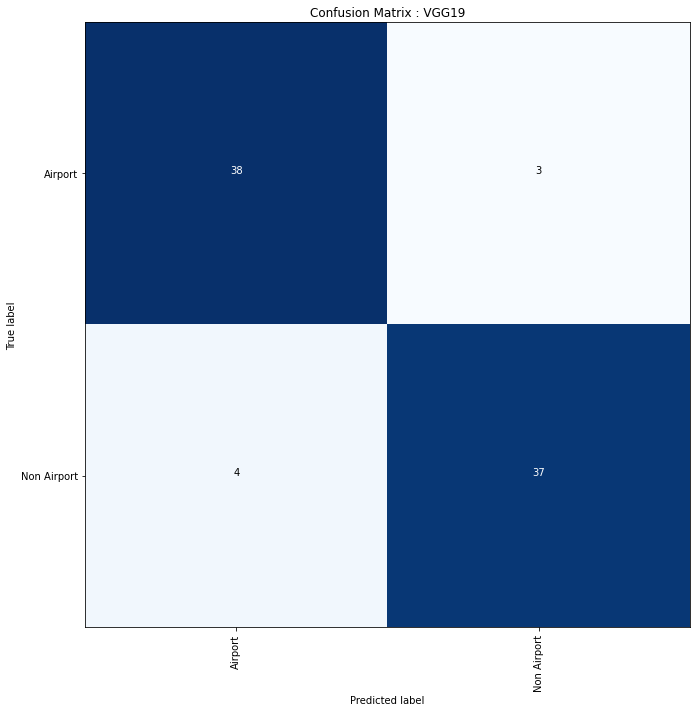

In [73]:
cm_VGG19_1, y_pred_VGG19_1=Calculate_ConfMatrix(modelVGG19_Trained_1)
plot_confusion_matrix(cm_VGG19_1, classes = category_names, title='Confusion Matrix : VGG19', normalize=False, figname = 'Confusion_matrix_concrete.jpg')
plt.show()

#### - Calculate the final accuracy

In [74]:
accuracy_VGG19_1 = accuracy_score(test_generator.classes, y_pred_VGG19_1)
print("Accuracy in test set: %0.1f%% " % (accuracy_VGG19_1 * 100))

Accuracy in test set: 91.5% 


# 5. Comparaison of the models accuracy

In [75]:
# create data with accuracy values for each model
data =  [["VGG16", "%0.1f%% " % (accuracy_VGG16_1 * 100)], 
        ["ResNet50", "%0.1f%% " % (accuracy_ResNet50_1 * 100)],
        ["InceptionV3", "%0.1f%% " % (accuracy_InceptionV3_1 * 100)],
        ["MobileNet", "%0.1f%% " % (accuracy_MobileNet_1 * 100)],
        ["DenseNet201","%0.1f%% " % (accuracy_DenseNet201_1 * 100)],
        ["Xception","%0.1f%% " % (accuracy_Xception_1 * 100)],
        ["VGG19", "%0.1f%% " % (accuracy_VGG19_1 * 100)]]
  
# define header names
col_names = ["Model Name", "Accuracy Value"]
  
# print table using the data and header names
print(tabulate(data, headers=col_names, tablefmt="fancy_grid"))


╒══════════════╤══════════════════╕
│ Model Name   │ Accuracy Value   │
╞══════════════╪══════════════════╡
│ VGG16        │ 97.6%            │
├──────────────┼──────────────────┤
│ ResNet50     │ 50.0%            │
├──────────────┼──────────────────┤
│ InceptionV3  │ 92.7%            │
├──────────────┼──────────────────┤
│ MobileNet    │ 95.1%            │
├──────────────┼──────────────────┤
│ DenseNet201  │ 97.6%            │
├──────────────┼──────────────────┤
│ Xception     │ 90.2%            │
├──────────────┼──────────────────┤
│ VGG19        │ 91.5%            │
╘══════════════╧══════════════════╛


## - Using Bar Chart 

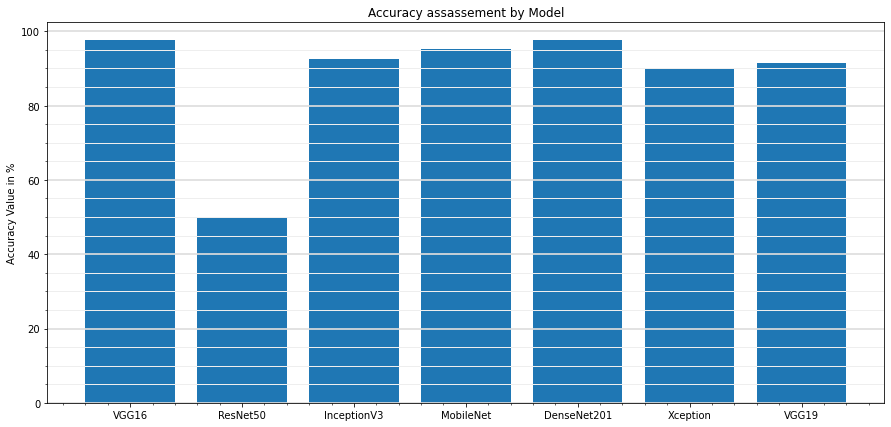

In [76]:
# Setting the size of the plot
plt.rcParams["figure.figsize"] = (15,7)

# Creating a new figure
fig, ax = plt.subplots()

# Defining the models and their corresponding accuracy values
Models = ['VGG16', 'ResNet50', 'InceptionV3', 'MobileNet','DenseNet201','Xception','VGG19']
Models_accuracy = [accuracy_VGG16_1*100, accuracy_ResNet50_1*100, accuracy_InceptionV3_1*100, accuracy_MobileNet_1*100,accuracy_DenseNet201_1*100, accuracy_Xception_1*100, accuracy_VGG19_1*100]

# Creating a bar plot of the models and their accuracy
ax.bar(Models, Models_accuracy, label=Models)

# Setting the y-label and title for the plot
ax.set_ylabel('Accuracy Value in %')
ax.set_title('Accuracy assassement by Model')

# Creating a grid for the y-axis
ax.grid(axis = 'y',which='major', color='#DDDDDD', linewidth=1.7)

# Creating a minor grid as well
ax.grid(axis = 'y',which='minor', color='#EEEEEE', linestyle='-', linewidth=1)

# Showing minor ticks and gridlines
ax.minorticks_on()

# Displaying the plot
plt.show()

#### - Getting the model having the best accuracy score:



In [77]:
#Create a dictionary with each model's accuracy as the key and its name as the value

Models_accuracies_dict = {accuracy_VGG16_1:'VGG16', accuracy_ResNet50_1:'ResNet50', 
                          accuracy_InceptionV3_1:'InceptionV3', accuracy_MobileNet_1:'MobileNet',
                          accuracy_DenseNet201_1:'DenseNet201', accuracy_Xception_1:'Xception', 
                          accuracy_VGG19_1:'VGG19'}

#Find the maximum accuracy score and round it to one decimal place
max_score=round((max(Models_accuracies_dict)*100), 1)

#Print the maximum accuracy value and the name of the model with the highest accuracy score
print('The max accuracy value is :',max_score,'%')

print('The model having the best accuracy score is: ', Models_accuracies_dict.get(max(Models_accuracies_dict)))


The max accuracy value is : 97.6 %
The model having the best accuracy score is:  DenseNet201


# 6.  Visualize the Prediction results of Airport Test Images 


### Now we are going to make predictions based on the highest model accuracy (VGG16) with the predicted and actual class 

Found 82 images belonging to 2 classes.


/tmp/ipykernel_23479/180749183.py:9: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  Y_pred = modelVGG16_Trained_1.predict_generator(test_subset_generator)
/tmp/ipykernel_23479/180749183.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


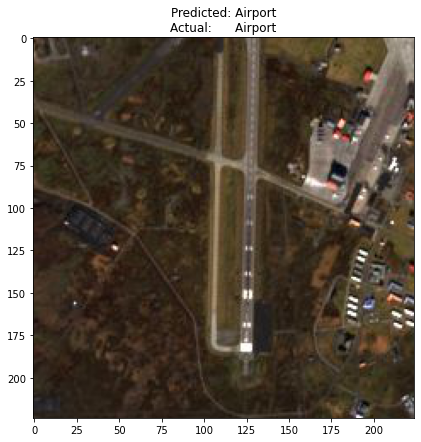

<Figure size 1080x504 with 0 Axes>

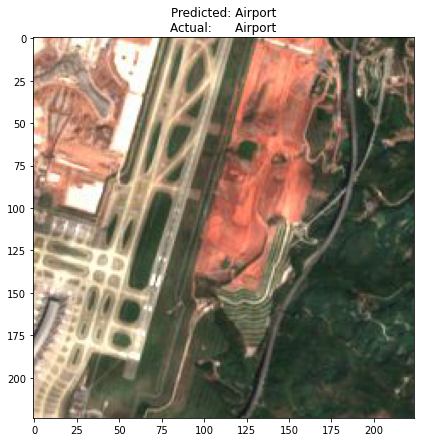

<Figure size 1080x504 with 0 Axes>

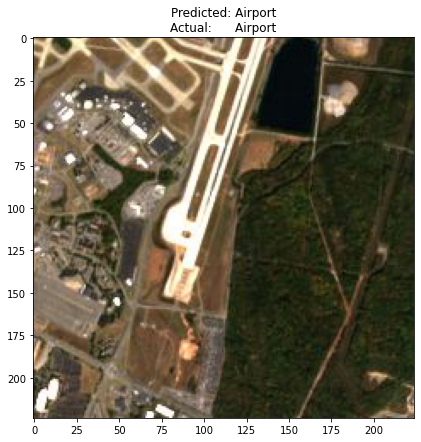

<Figure size 1080x504 with 0 Axes>

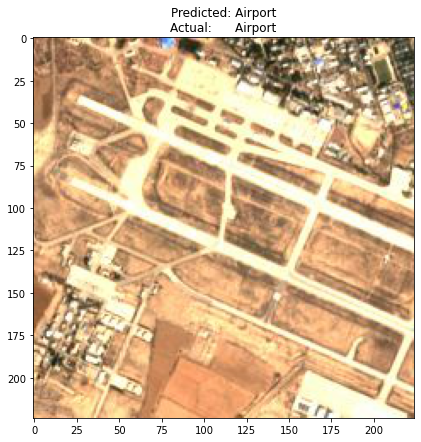

<Figure size 1080x504 with 0 Axes>

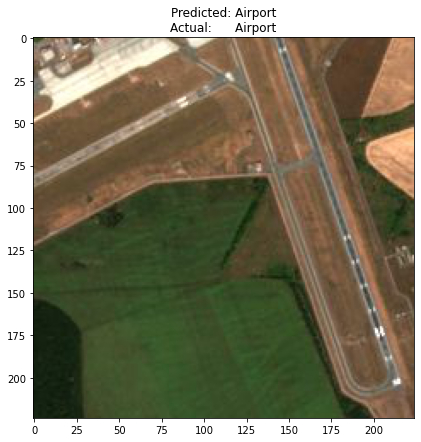

<Figure size 1080x504 with 0 Axes>

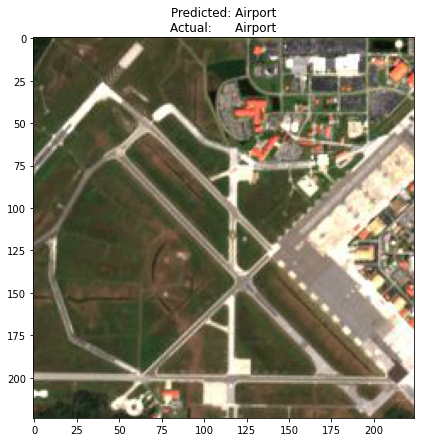

<Figure size 1080x504 with 0 Axes>

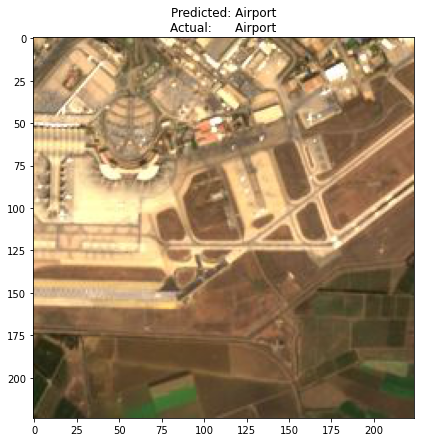

<Figure size 1080x504 with 0 Axes>

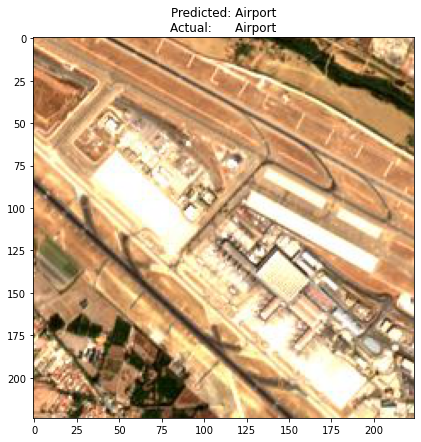

<Figure size 1080x504 with 0 Axes>

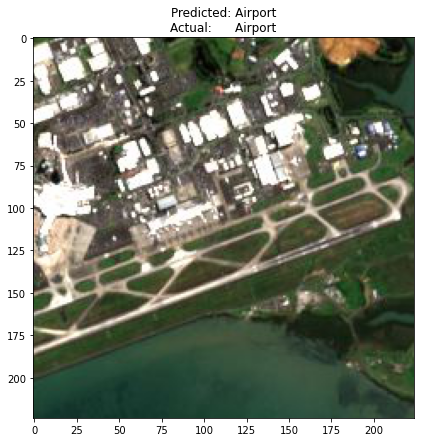

<Figure size 1080x504 with 0 Axes>

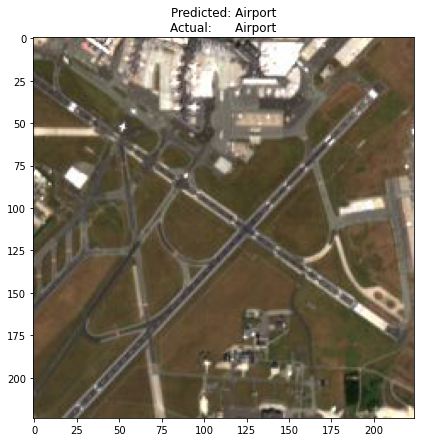

<Figure size 1080x504 with 0 Axes>

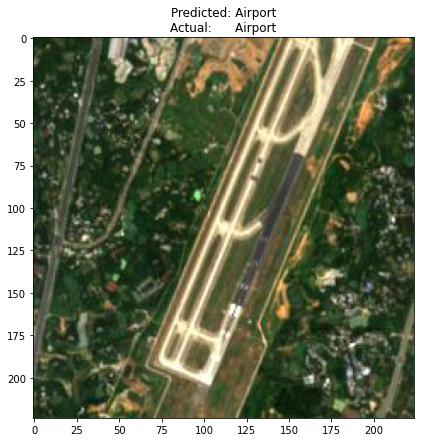

<Figure size 1080x504 with 0 Axes>

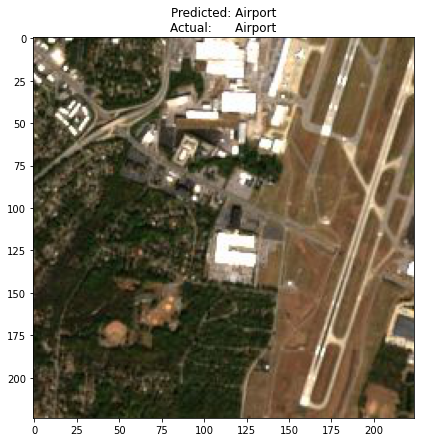

<Figure size 1080x504 with 0 Axes>

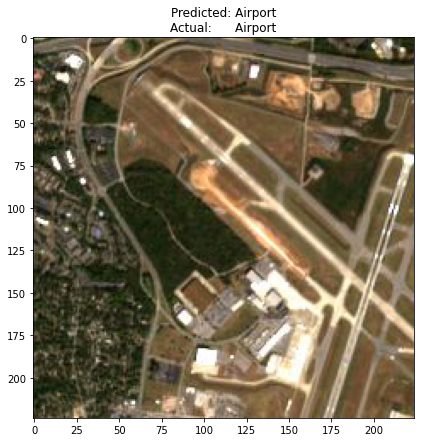

<Figure size 1080x504 with 0 Axes>

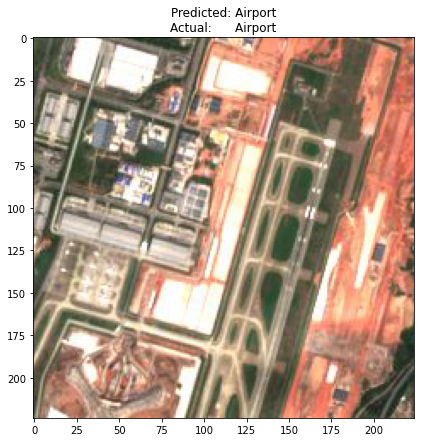

<Figure size 1080x504 with 0 Axes>

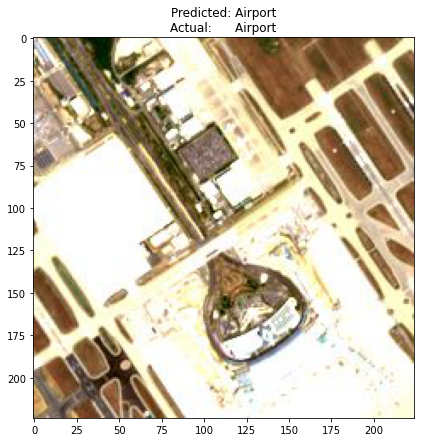

<Figure size 1080x504 with 0 Axes>

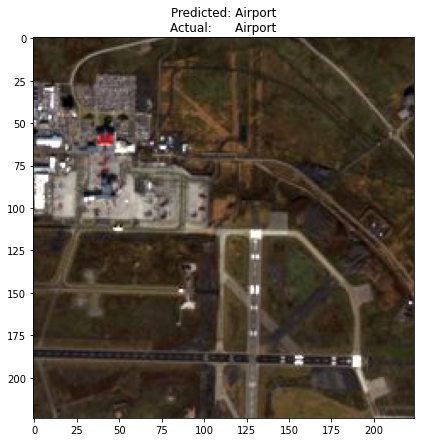

<Figure size 1080x504 with 0 Axes>

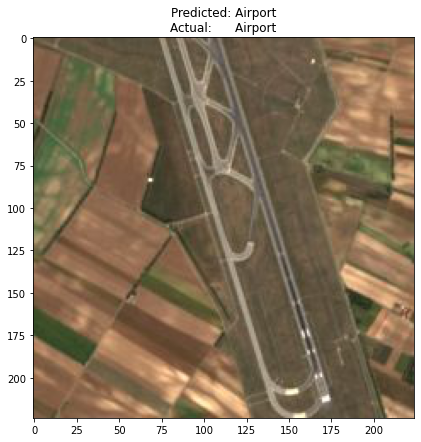

<Figure size 1080x504 with 0 Axes>

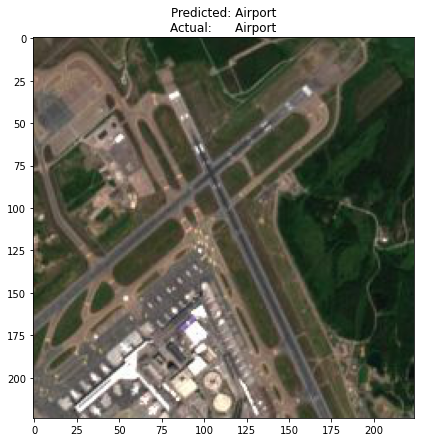

<Figure size 1080x504 with 0 Axes>

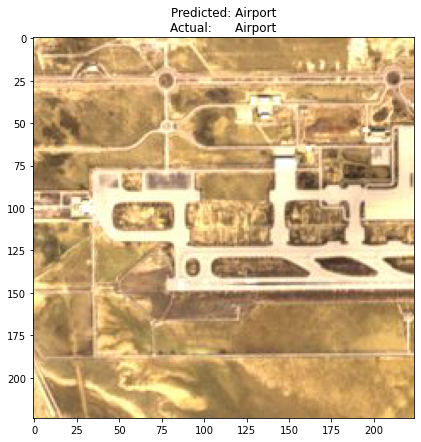

<Figure size 1080x504 with 0 Axes>

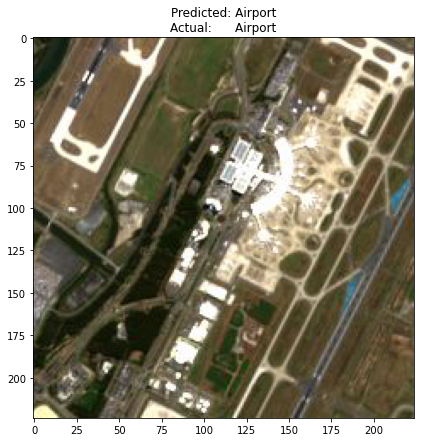

<Figure size 1080x504 with 0 Axes>

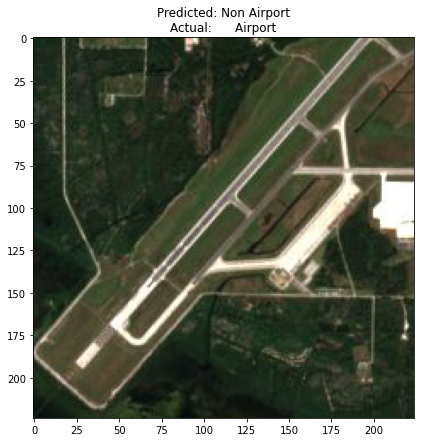

<Figure size 1080x504 with 0 Axes>

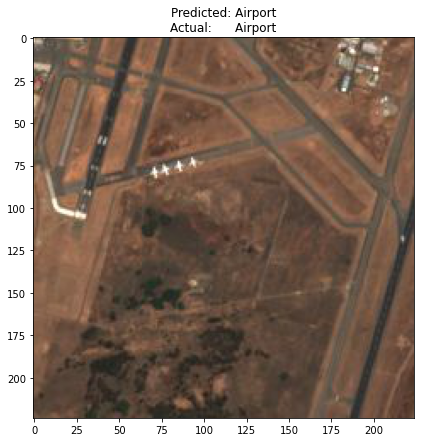

<Figure size 1080x504 with 0 Axes>

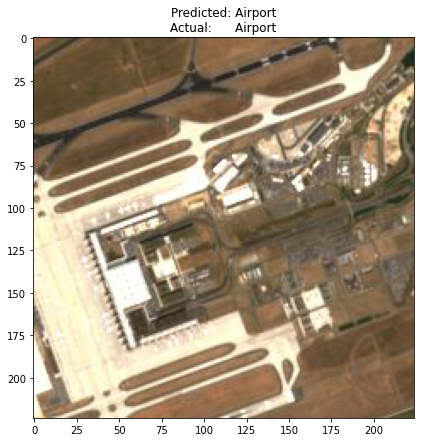

<Figure size 1080x504 with 0 Axes>

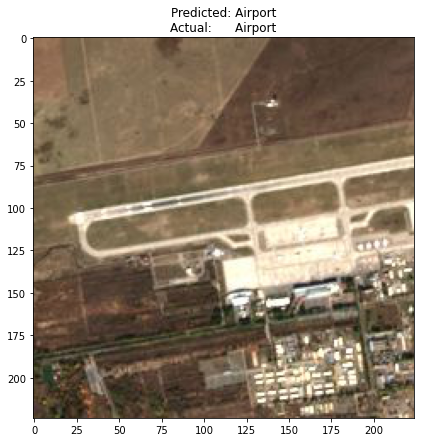

<Figure size 1080x504 with 0 Axes>

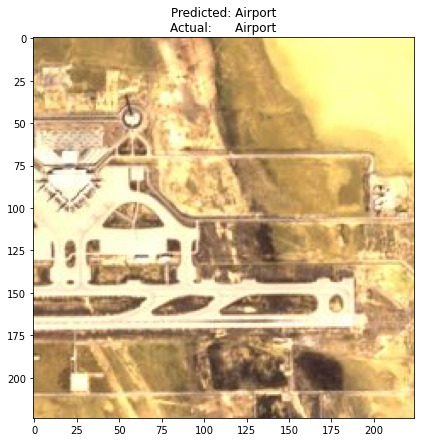

<Figure size 1080x504 with 0 Axes>

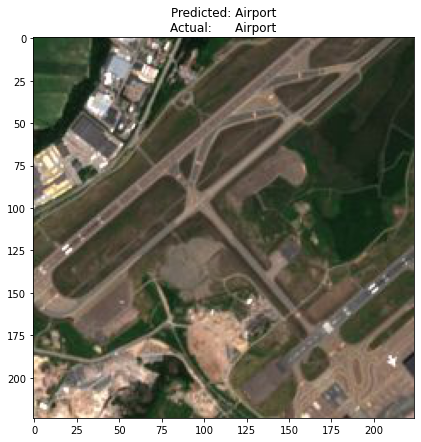

<Figure size 1080x504 with 0 Axes>

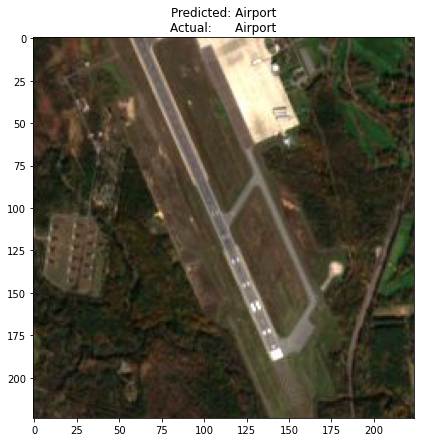

<Figure size 1080x504 with 0 Axes>

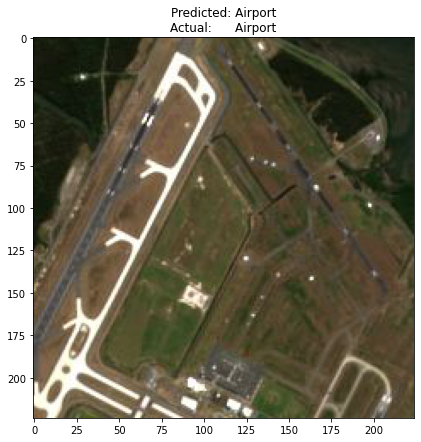

<Figure size 1080x504 with 0 Axes>

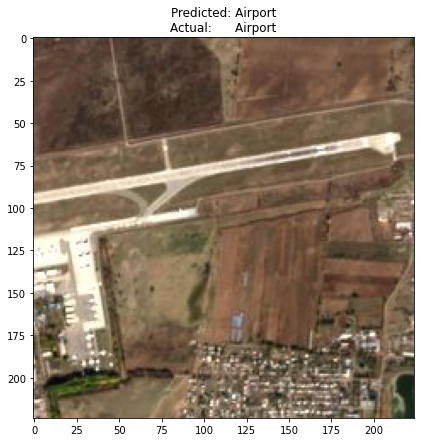

<Figure size 1080x504 with 0 Axes>

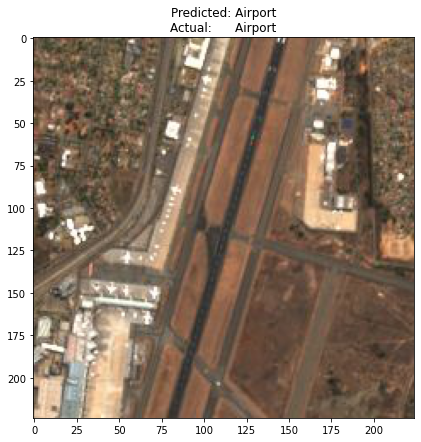

<Figure size 1080x504 with 0 Axes>

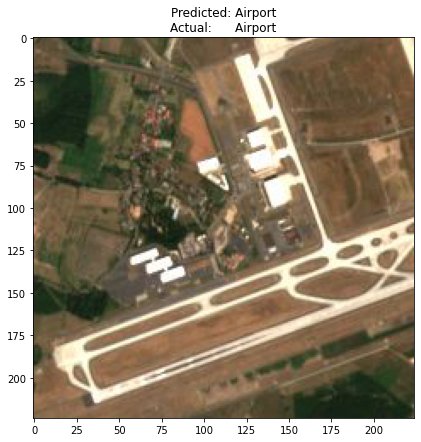

<Figure size 1080x504 with 0 Axes>

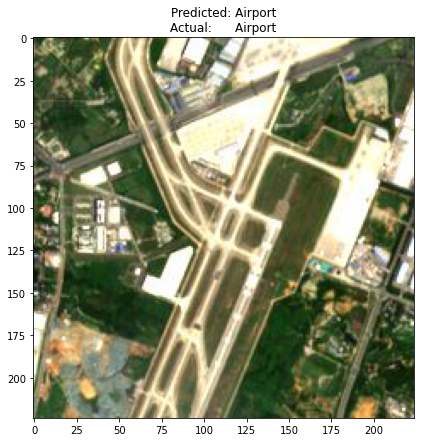

<Figure size 1080x504 with 0 Axes>

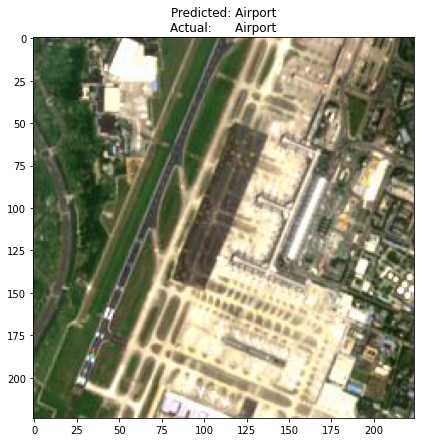

<Figure size 1080x504 with 0 Axes>

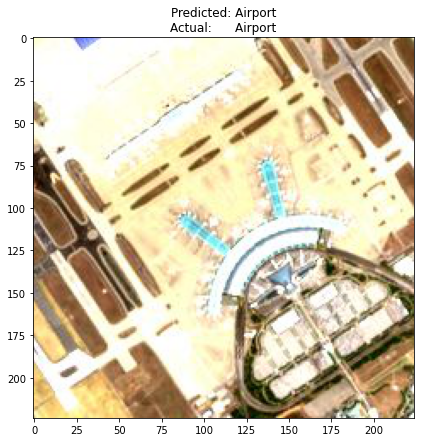

<Figure size 1080x504 with 0 Axes>

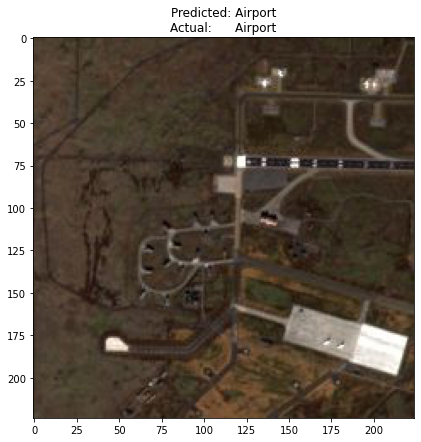

<Figure size 1080x504 with 0 Axes>

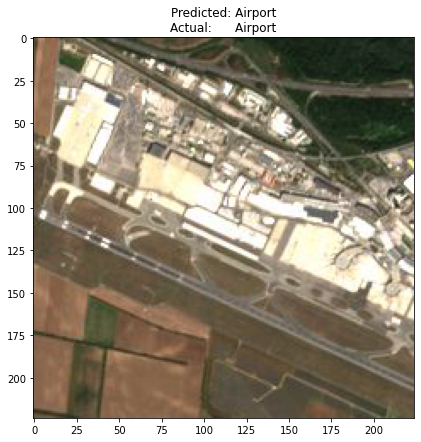

<Figure size 1080x504 with 0 Axes>

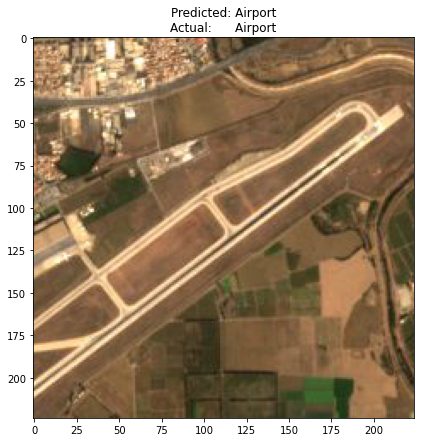

<Figure size 1080x504 with 0 Axes>

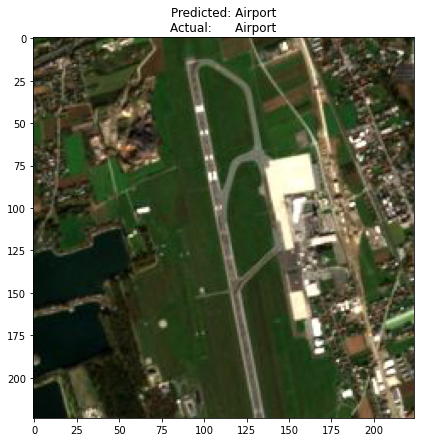

<Figure size 1080x504 with 0 Axes>

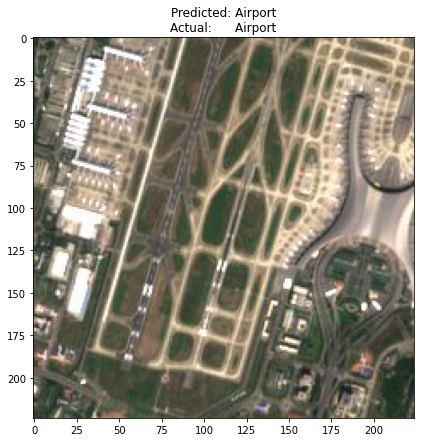

<Figure size 1080x504 with 0 Axes>

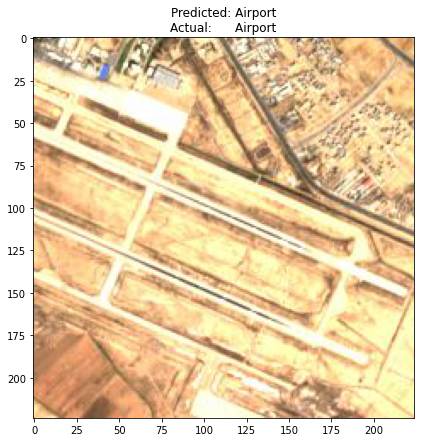

<Figure size 1080x504 with 0 Axes>

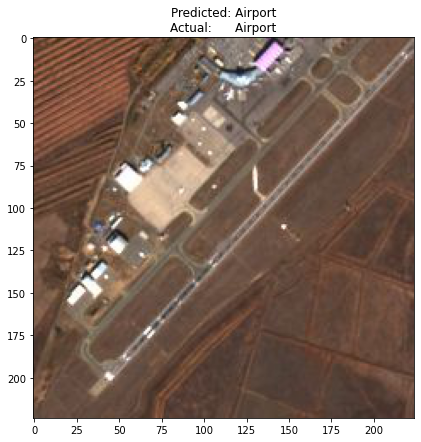

<Figure size 1080x504 with 0 Axes>

In [78]:
# Create a test generator for the subset of the test data
test_subset_generator = test_datagen.flow_from_directory(test_data_dir,
                                                         target_size = (img_height, img_width),
                                                         batch_size = batch_size,
                                                         class_mode = "categorical",
                                                         shuffle=False)

# Predict the classes of the images in the test generator using the trained VGG16 model
Y_pred = modelVGG16_Trained_1.predict_generator(test_subset_generator)
y_pred = np.argmax(Y_pred, axis=1)

# Display predicted and actual emotions for each image in the Airport subset of the test data
img_nr = 0
for subdir, dirs, files in os.walk(os.path.join(test_data_dir, 'Airport')):
    for file in files:
        img_file = subdir + '/' + file
        image = load_img(img_file,target_size=(img_height,img_width))
        pred_emotion = category_names[y_pred[img_nr]]
        real_emotion = category_names[test_subset_generator.classes[img_nr]]
        plt.figure()
        plt.title('Predicted: ' + pred_emotion + '\n' + 'Actual:      ' + real_emotion)
        plt.imshow(image)
        img_nr = img_nr +1
        plt.figure()
        
# Display the plotted images
plt.show()
